# Subclustering of lateral ectoderm in Set3

In [1]:
# loading packages
library(Seurat)
library(ggplot2)
library(magrittr)
library(data.table)
library(Matrix)
library(dplyr)
library(tibble)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
#loading data
seu_HQC <- readRDS(file = "../../data/seurat_object/Set3/seu_HQC_Set3.obj")

In [3]:
seu_HQC

An object of class Seurat 
28756 features across 6180 samples within 2 assays 
Active assay: SCT (11250 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


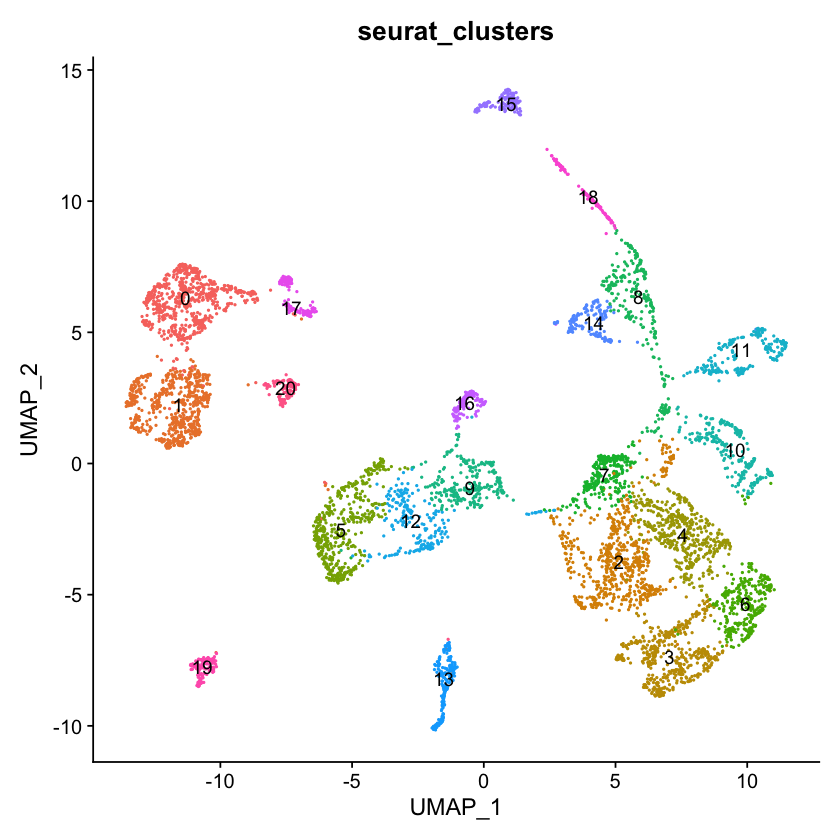

In [4]:
DimPlot(seu_HQC, reduction =  "umap", label = TRUE, group.by = 'seurat_clusters') + NoLegend()

## Pickup the taget clusters

Saving 7 x 7 in image



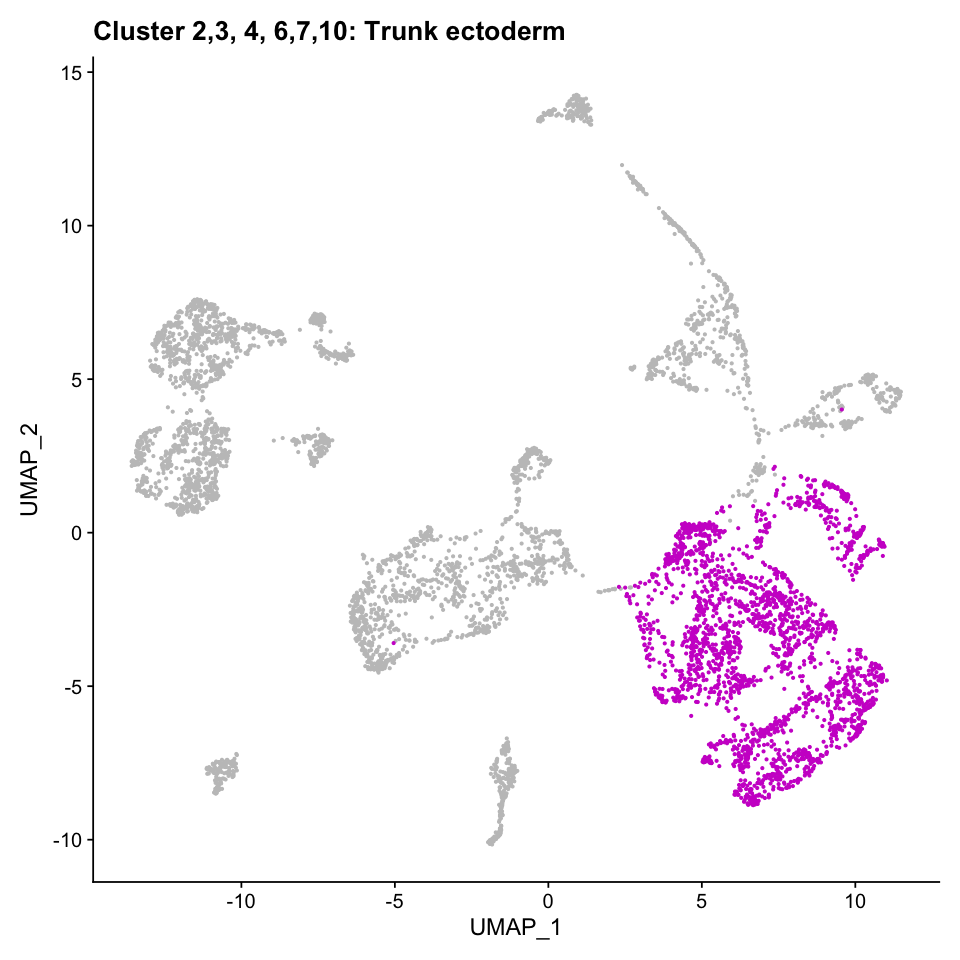

In [5]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(2,3,4,6,7,10))
fig <- DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta3', label = FALSE) + NoLegend() + ggtitle('Cluster 2,3, 4, 6,7,10: Trunk ectoderm')
fig
ggsave(fig, file = './figures/02_subclustering_lateral_ect_manualID/Highlight_lateral_ecto.eps')

In [6]:
seu_HQC_trunk_ect <- subset(seu_HQC, ident = c(2,3,4,6,7,10))
seu_HQC_trunk_ect

An object of class Seurat 
28756 features across 2368 samples within 2 assays 
Active assay: SCT (11250 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [7]:
seu_HQC_trunk_ect$allcell_clusters <- Idents(object = seu_HQC_trunk_ect)

## renormalize and clustering

In [8]:
# re-normalize
DefaultAssay(seu_HQC_trunk_ect) <- "RNA"
seu_HQC_trunk_ect <- suppressWarnings(SCTransform(seu_HQC_trunk_ect, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE))

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


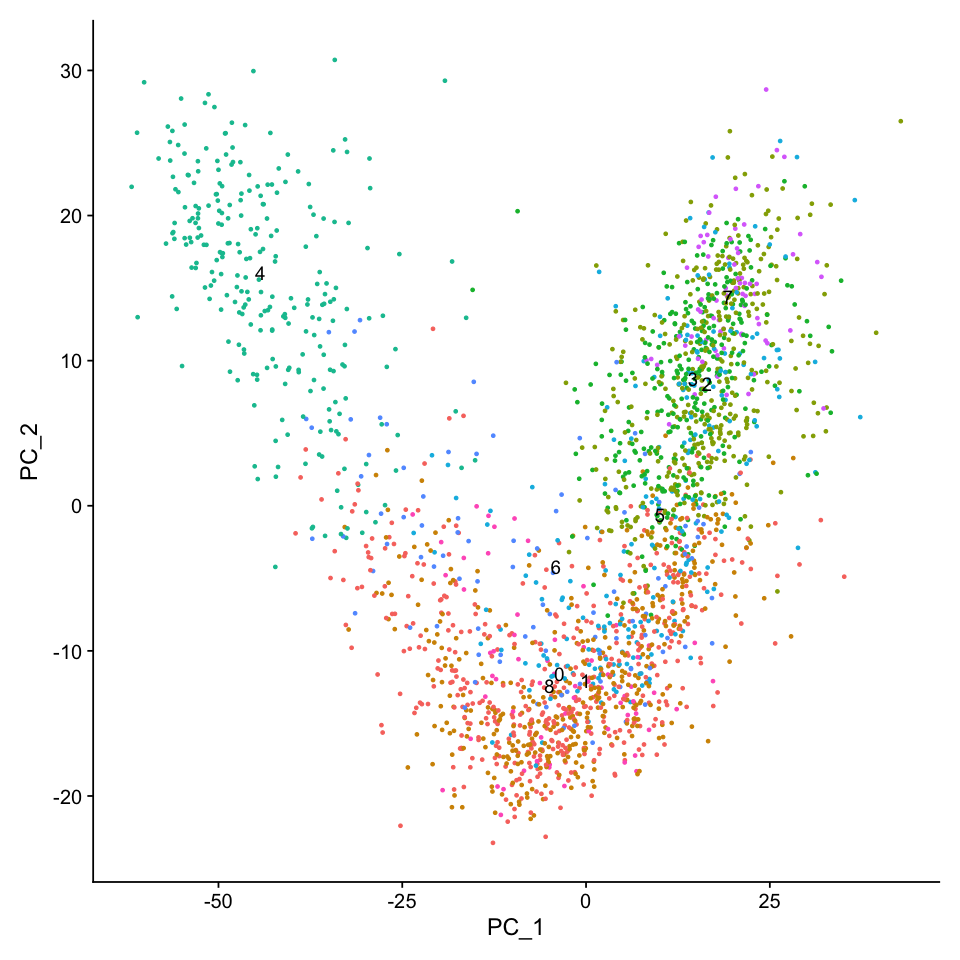

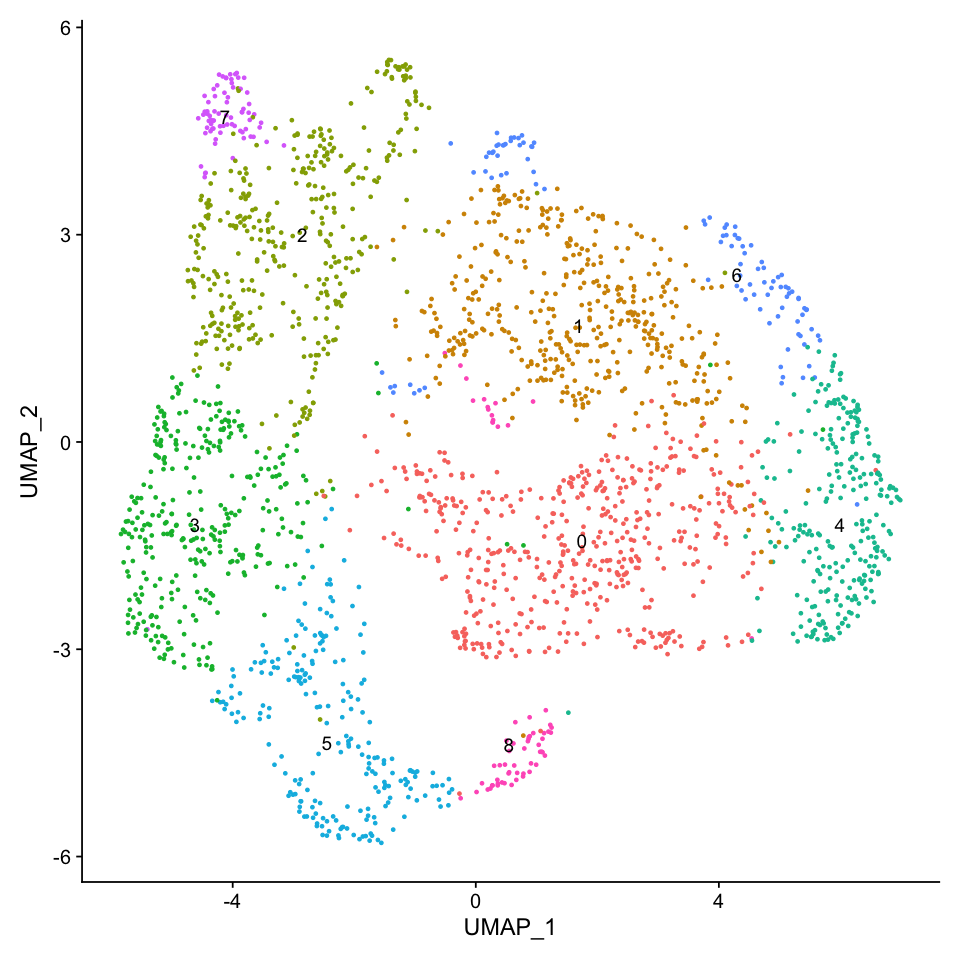

In [9]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_trunk_ect <- RunPCA(seu_HQC_trunk_ect, verbose = FALSE)
# seu_HQC_trunk_ect <- RunTSNE(seu_HQC_trunk_ect, dims = 1:30, verbose = FALSE)
seu_HQC_trunk_ect <- RunUMAP(seu_HQC_trunk_ect, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC_trunk_ect <- FindNeighbors(seu_HQC_trunk_ect, dims = 1:30, verbose = FALSE)
seu_HQC_trunk_ect <- FindClusters(seu_HQC_trunk_ect, verbose = FALSE)
DimPlot(seu_HQC_trunk_ect, reduction =  "pca", label = TRUE) + NoLegend()
# DimPlot(seu_HQC_trunk_ect, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_HQC_trunk_ect, reduction =  "umap", label = TRUE) + NoLegend()

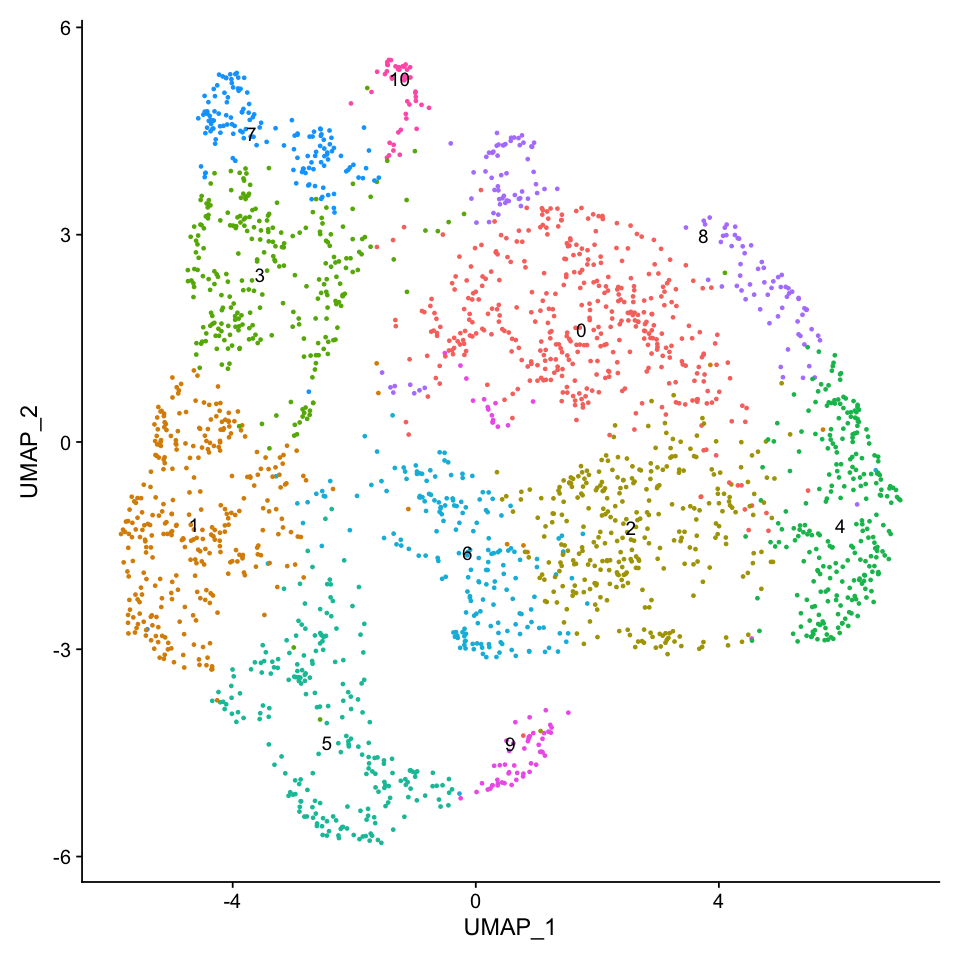

In [10]:
seu_HQC_trunk_ect <- FindClusters(seu_HQC_trunk_ect, verbose = FALSE, resolution = 1)
DimPlot(seu_HQC_trunk_ect, reduction =  "umap", label = TRUE) + NoLegend()

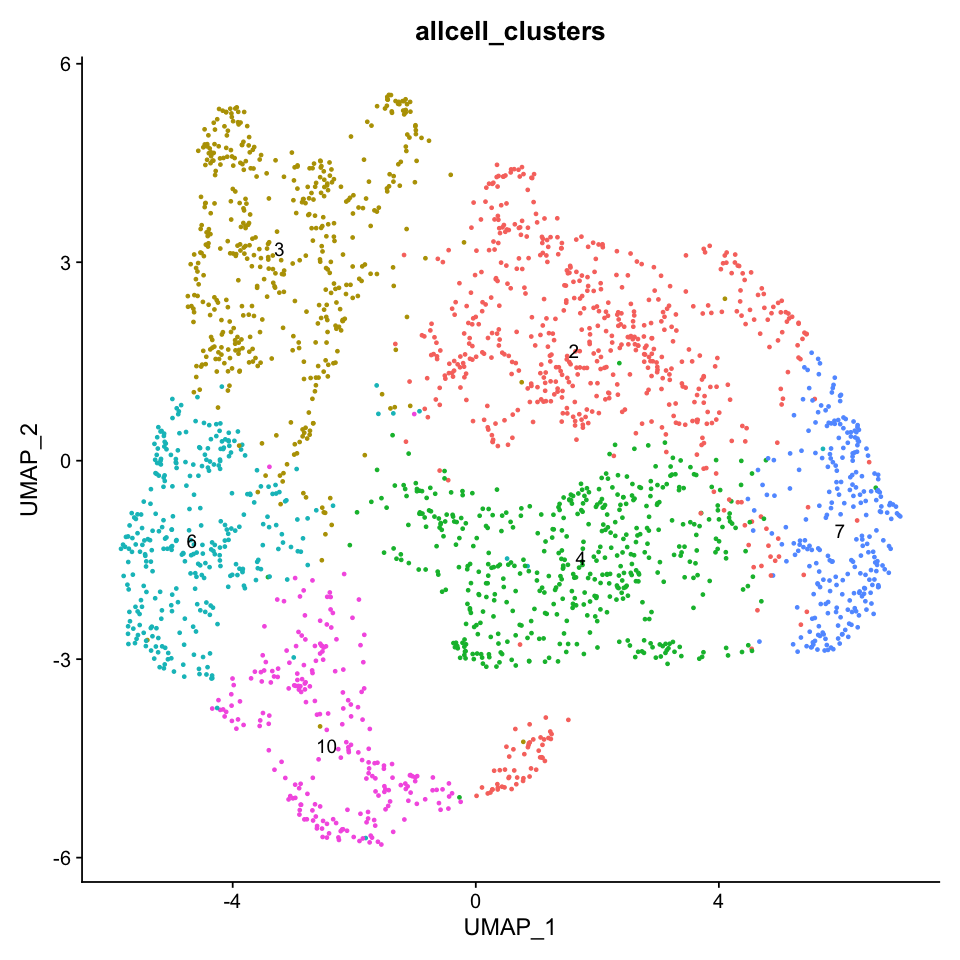

In [11]:
DimPlot(seu_HQC_trunk_ect, reduction =  "umap", label = TRUE, group.by = "allcell_clusters") + NoLegend()

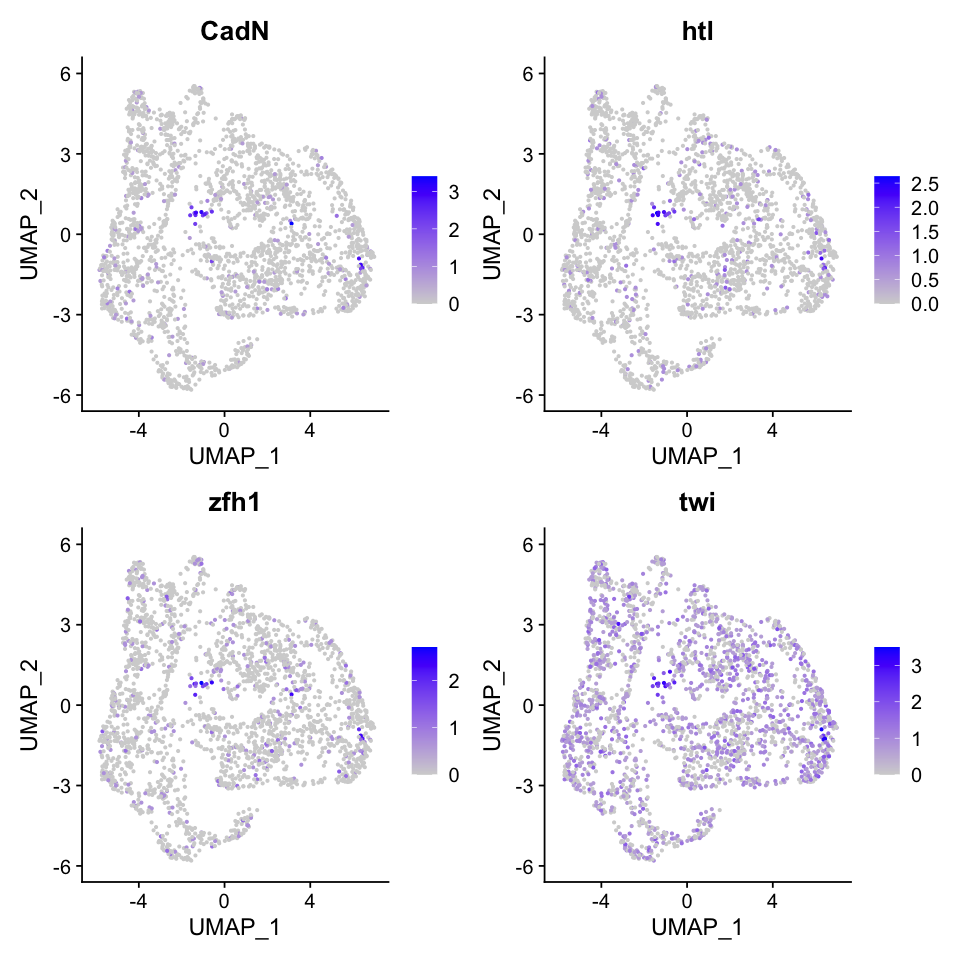

In [12]:
#Check Mesoderm markers
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_HQC_trunk_ect, reduction = "umap", features = c("CadN", "htl", "zfh1", "twi"), pt.size = 0.5,  ncol = 2)

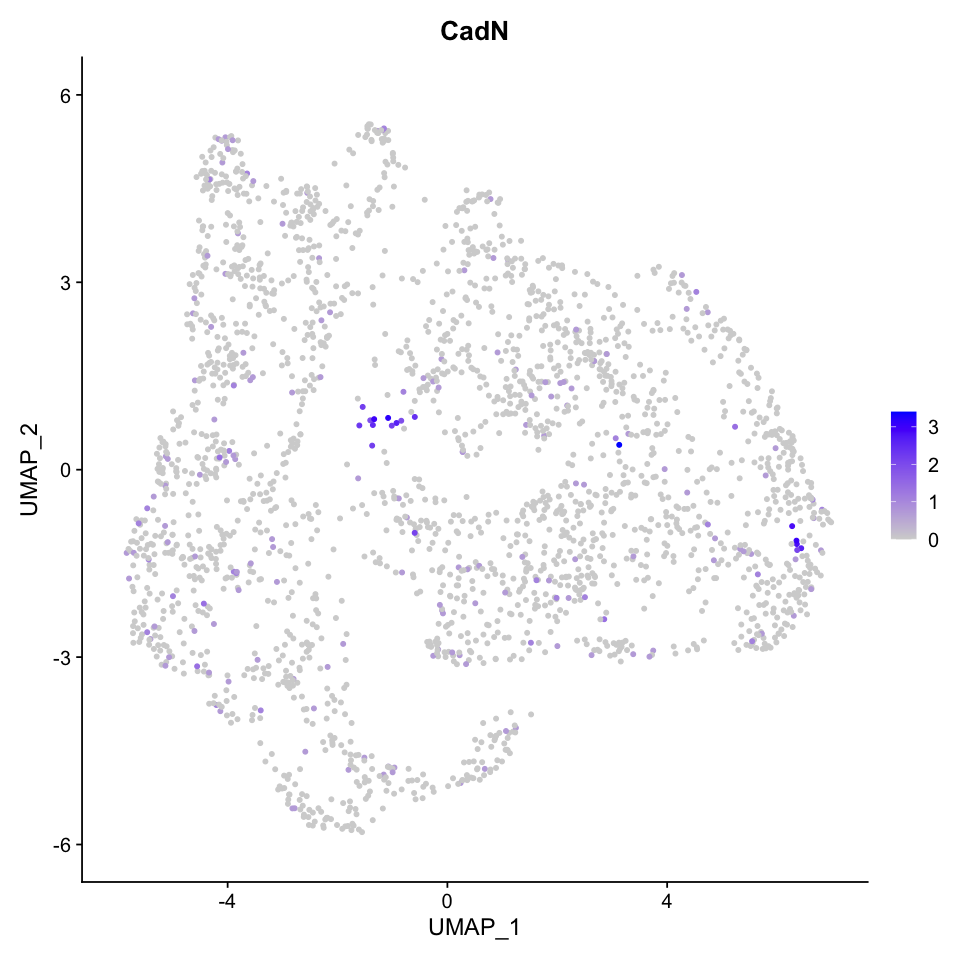

In [13]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_HQC_trunk_ect, reduction = "umap", features = c("CadN"), pt.size = 1,  ncol = 1)

Poplulation expressing mesoderm marker existed. (doublets)

## Removing doublets

In [14]:
count_temp <-  GetAssayData(seu_HQC_trunk_ect, slot = "data")
count_temp <- as.data.frame(t(count_temp))
head(count_temp)

,Myo81F,Pzl,Parp,Alg-2,Tim17b,CG41128,CG41099,Gfat1,CG40198,CG12581,⋯,mt:tRNA:Leu-TAG,mt:lrRNA,mt:tRNA:Val-TAC,mt:srRNA,Gpa2,klhl10,SteXh:CG42398,Su(Ste):CR42418,GAL4,CD8mCherry
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACCCAAGCAACAAT,0,0,2.397895,1.609438,2.944439,1.945910,0.6931472,0,0,1.609438,⋯,0,8.040125,0,1.609438,0,0,0.6931472,0,0,0
AAACCCACAGGGAGAG,0,0,2.197225,1.386294,3.218876,2.302585,1.7917595,0,0,1.098612,⋯,0,7.968666,0,1.098612,0,0,0.6931472,0,0,0
AAACCCATCCAGTGCG,0,0,1.386294,0.000000,2.302585,2.197225,1.3862944,0,0,2.197225,⋯,0,8.044947,0,2.564949,0,0,0.0000000,0,0,0
AAACCCATCCGGACTG,0,0,2.772589,1.386294,2.944439,1.791759,0.6931472,0,0,2.639057,⋯,0,8.111028,0,2.564949,0,0,0.0000000,0,0,0
AAACGAAAGACATAGT,0,0,2.484907,1.945910,3.044522,2.564949,0.6931472,0,0,1.098612,⋯,0,8.126223,0,1.791759,0,0,0.0000000,0,0,0
AAACGAACACATACTG,0,0,2.197225,1.386294,2.708050,2.079442,1.0986123,0,0,2.397895,⋯,0,7.938089,0,2.397895,0,0,0.0000000,0,0,0


In [15]:
count_temp_doublet <- filter(count_temp, CadN > 1.5) #remove doublet
dim(count_temp_doublet)

[1]   18 9808

In [16]:
doublet_list <- rownames(count_temp_doublet)
length(doublet_list)

[1] 18

In [17]:
ID <- rep("doublet", length=length(doublet_list)) 
ID

[1] "doublet" "doublet" "doublet" "doublet" "doublet" "doublet" "doublet"
 [8] "doublet" "doublet" "doublet" "doublet" "doublet" "doublet" "doublet"
[15] "doublet" "doublet" "doublet" "doublet"

In [18]:
doublet_ID <- data.frame(doublet_list, ID)
doublet_ID <- doublet_ID %>% column_to_rownames("doublet_list")

head(doublet_ID)

,ID
,<chr>
AATTCCTGTTCGGCGT,doublet
AGGATCTAGCCGTAAG,doublet
AGGATCTCAGATTAAG,doublet
AGGGTGATCGATACAC,doublet
CATACTTGTATCGCTA,doublet
CCACGAGCAATGAAAC,doublet


In [19]:
write.table(doublet_ID, file="./manual_ID_list/seu_HQC_ect_doublet_manualID.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [20]:
count_temp_singlet <- filter(count_temp, CadN <= 1.5)
singlet_list <- rownames(count_temp_singlet)
length(singlet_list)

[1] 2350

In [21]:
seu_HQC_trunk_ect_temp <- seu_HQC_trunk_ect

In [22]:
seu_HQC_trunk_ect <- seu_HQC_trunk_ect_temp[, singlet_list]
seu_HQC_trunk_ect

An object of class Seurat 
27314 features across 2350 samples within 2 assays 
Active assay: SCT (9808 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

## Clustering again

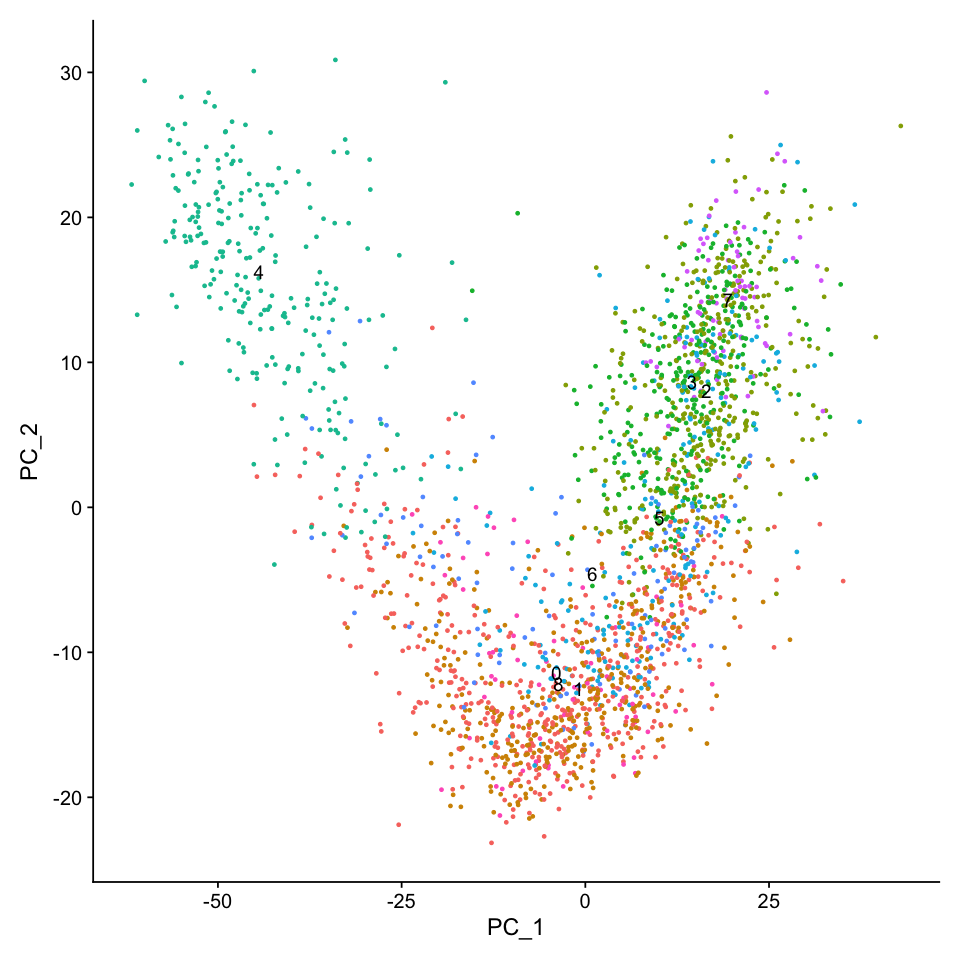

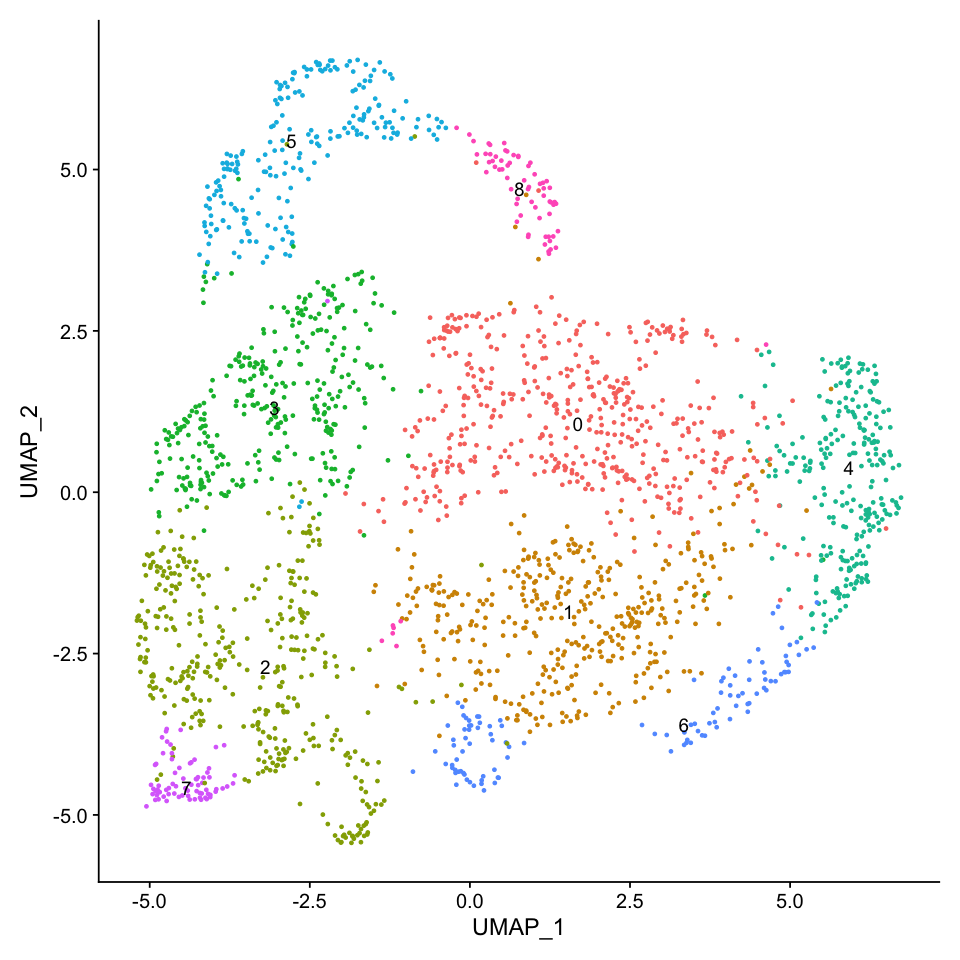

In [23]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_trunk_ect <- RunPCA(seu_HQC_trunk_ect, verbose = FALSE)
# seu_HQC_trunk_ect <- RunTSNE(seu_HQC_trunk_ect, dims = 1:30, verbose = FALSE)
seu_HQC_trunk_ect <- RunUMAP(seu_HQC_trunk_ect, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC_trunk_ect <- FindNeighbors(seu_HQC_trunk_ect, dims = 1:30, verbose = FALSE)
seu_HQC_trunk_ect <- FindClusters(seu_HQC_trunk_ect, verbose = FALSE)
DimPlot(seu_HQC_trunk_ect, reduction =  "pca", label = TRUE) + NoLegend()
# DimPlot(seu_HQC_trunk_ect, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_HQC_trunk_ect, reduction =  "umap", label = TRUE) + NoLegend()

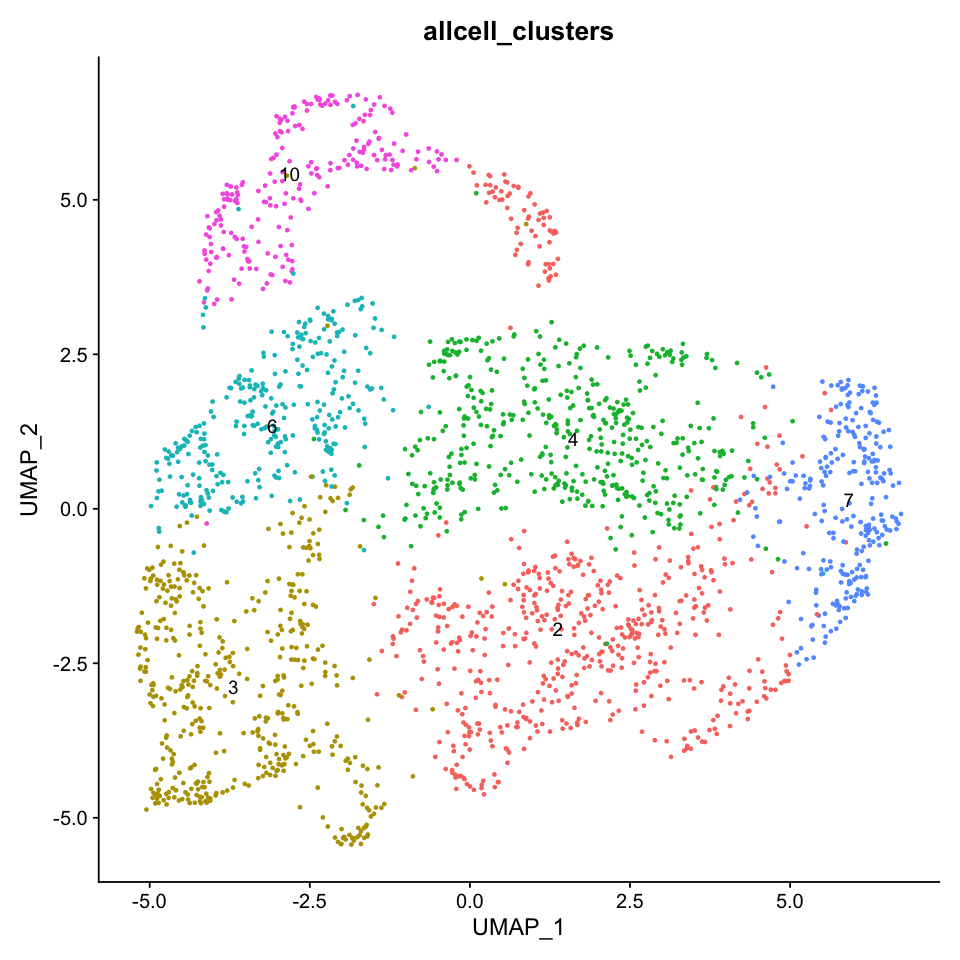

In [24]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC_trunk_ect, reduction =  "umap", label = TRUE, group.by = "allcell_clusters") + NoLegend()

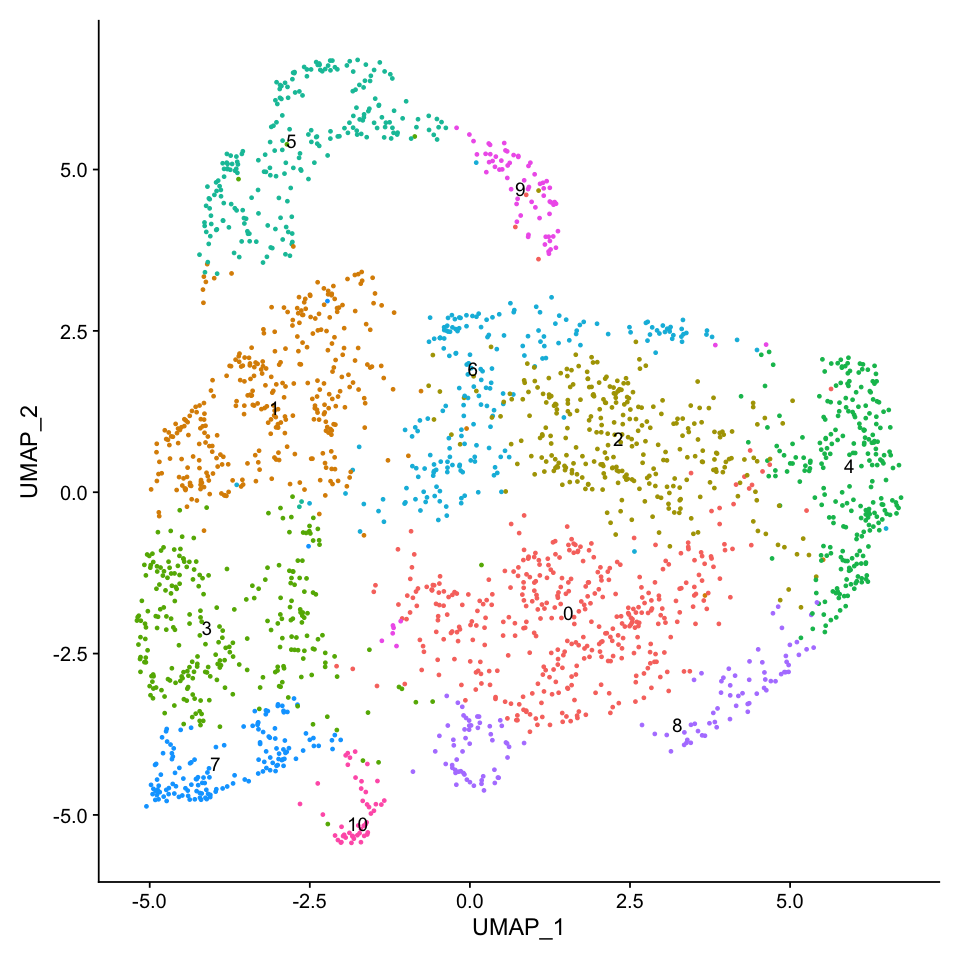

In [25]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_trunk_ect <- FindClusters(seu_HQC_trunk_ect, verbose = FALSE, resolution = 1)
fig <- DimPlot(seu_HQC_trunk_ect, reduction =  "umap", label = TRUE) + NoLegend()
fig
ggsave(fig, file = './figures/02_subclustering_lateral_ect_manualID/lateral_ecto_seurat_clusters.eps', width = 8, height = 8)

In [26]:
all.markers.trunk.ect <- FindAllMarkers(object = seu_HQC_trunk_ect, only.pos = TRUE)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10



In [27]:
all.markers.trunk.ect.top10 <- all.markers.trunk.ect %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

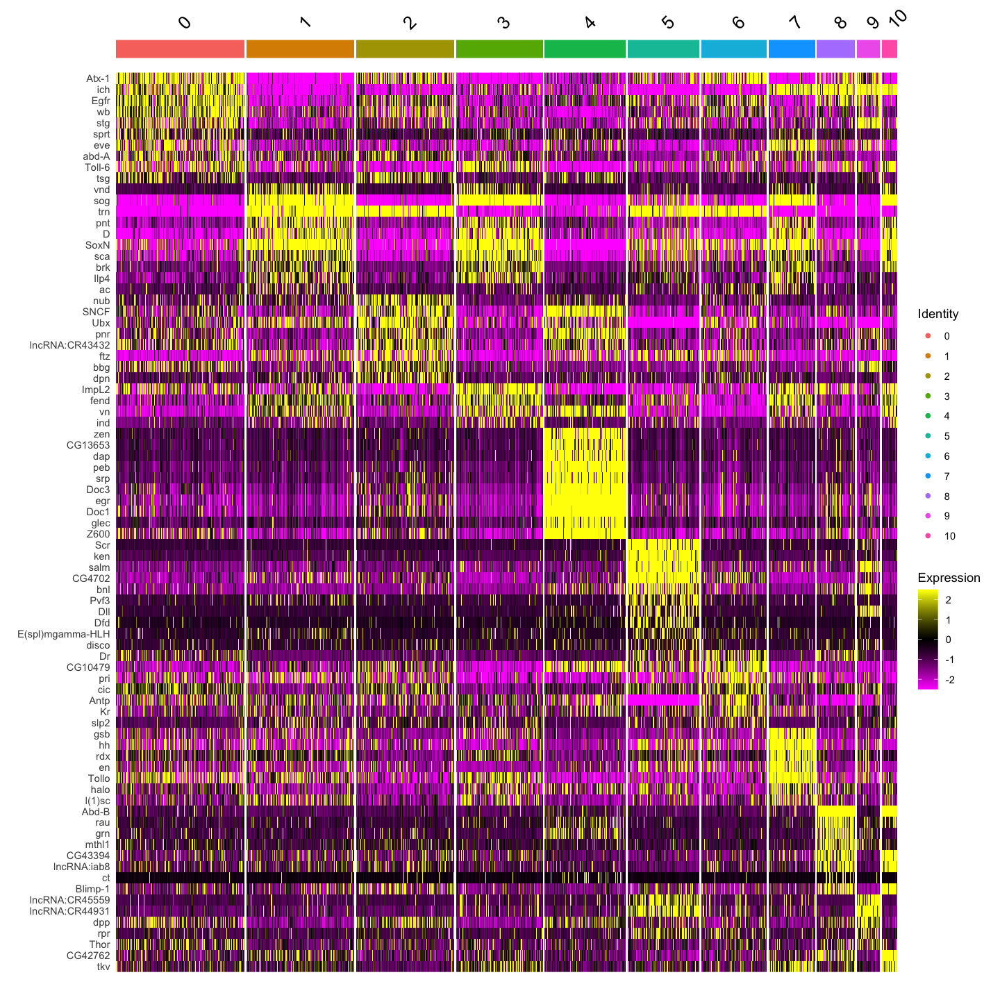

In [28]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu_HQC_trunk_ect, features = c(all.markers.trunk.ect.top10$gene))

## AP-Annotation

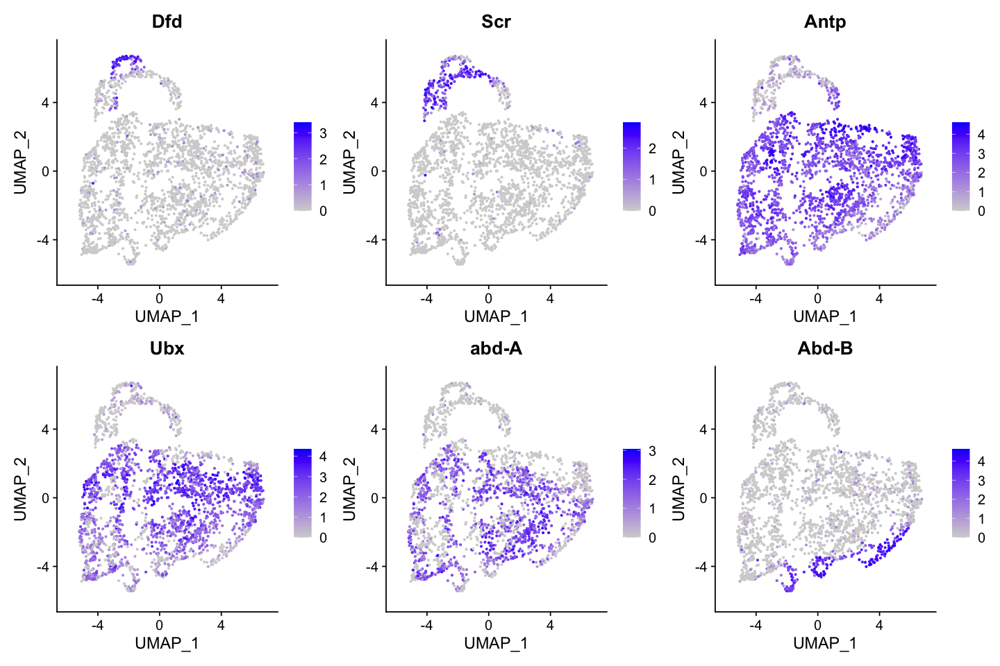

In [29]:
options(repr.plot.width=12, repr.plot.height=8)
FeaturePlot(seu_HQC_trunk_ect, reduction = "umap", features = c("Dfd", "Scr", "Antp", "Ubx", "abd-A","Abd-B"), 
            pt.size = 0.5,  ncol = 3)

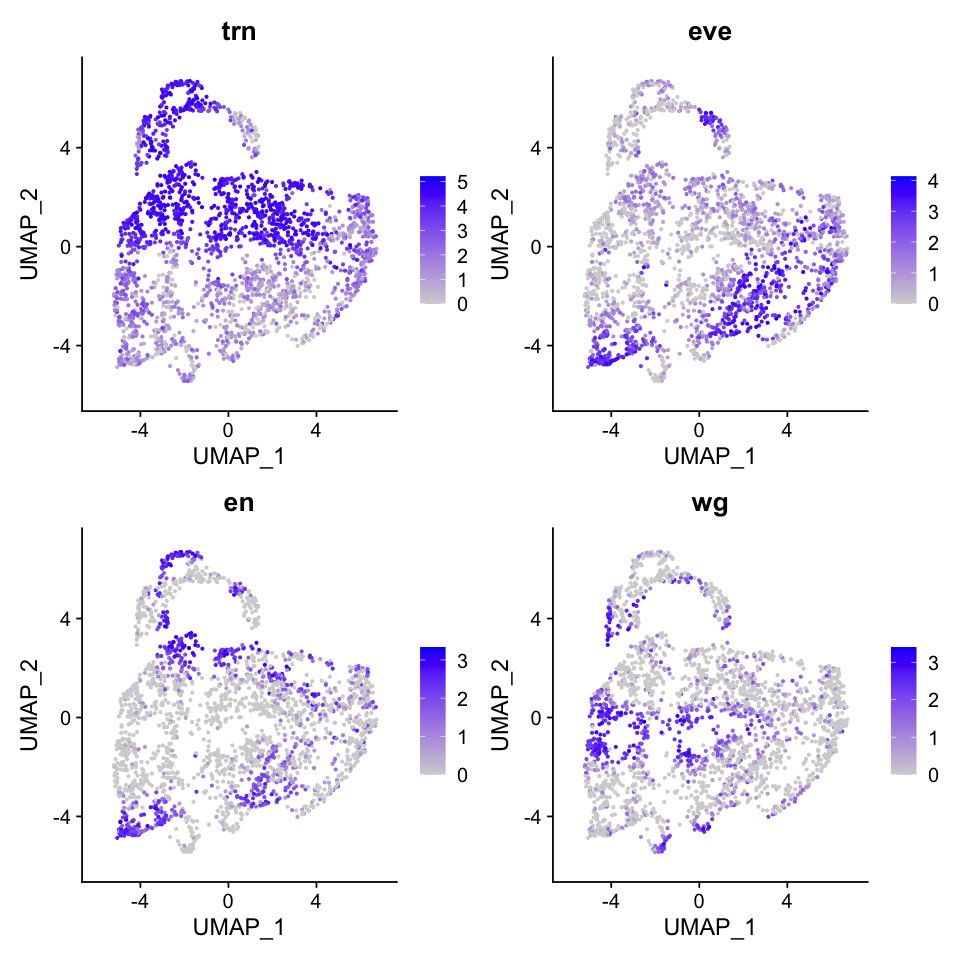

In [30]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_HQC_trunk_ect, reduction = "umap", features = c("trn","eve","en","wg"), pt.size = 0.5,  ncol = 2)

In [31]:
path = './figures/02_subclustering_lateral_ect_manualID'
for (name in c("trn","eve","en","wg","Dfd", "Scr", "Antp", "Ubx", "abd-A","Abd-B")){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC_trunk_ect, features = name)
    basename = paste(name, 'Set3_lateral_ecto.eps')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

In [32]:
count_temp <-  GetAssayData(seu_HQC_trunk_ect, slot = "data")
count_temp <- as.data.frame(t(count_temp))
head(count_temp)
library(tidyverse)
colnames(count_temp) = str_replace(colnames(count_temp), '-', '_')
colnames(count_temp) = str_replace(colnames(count_temp), ':', '_')

,Myo81F,Pzl,Parp,Alg-2,Tim17b,CG41128,CG41099,Gfat1,CG40198,CG12581,⋯,mt:tRNA:Leu-TAG,mt:lrRNA,mt:tRNA:Val-TAC,mt:srRNA,Gpa2,klhl10,SteXh:CG42398,Su(Ste):CR42418,GAL4,CD8mCherry
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACCCAAGCAACAAT,0,0,2.397895,1.609438,2.944439,1.945910,0.6931472,0,0,1.609438,⋯,0,8.040125,0,1.609438,0,0,0.6931472,0,0,0
AAACCCACAGGGAGAG,0,0,2.197225,1.386294,3.218876,2.302585,1.7917595,0,0,1.098612,⋯,0,7.968666,0,1.098612,0,0,0.6931472,0,0,0
AAACCCATCCAGTGCG,0,0,1.386294,0.000000,2.302585,2.197225,1.3862944,0,0,2.197225,⋯,0,8.044947,0,2.564949,0,0,0.0000000,0,0,0
AAACCCATCCGGACTG,0,0,2.772589,1.386294,2.944439,1.791759,0.6931472,0,0,2.639057,⋯,0,8.111028,0,2.564949,0,0,0.0000000,0,0,0
AAACGAAAGACATAGT,0,0,2.484907,1.945910,3.044522,2.564949,0.6931472,0,0,1.098612,⋯,0,8.126223,0,1.791759,0,0,0.0000000,0,0,0
AAACGAACACATACTG,0,0,2.197225,1.386294,2.708050,2.079442,1.0986123,0,0,2.397895,⋯,0,7.938089,0,2.397895,0,0,0.0000000,0,0,0


Registered S3 method overwritten by 'cli':
  method     from    
  print.boxx spatstat

─ Attaching packages ──────────────────────────────────────────────────────────── tidyverse 1.3.0 ─

✔ tidyr   1.1.2     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.0
✔ purrr   0.3.4     

─ Conflicts ───────────────────────────────────────────────────────────── tidyverse_conflicts() ─
✖ dplyr::between()   masks data.table::between()
✖ tidyr::expand()    masks Matrix::expand()
✖ tidyr::extract()   masks magrittr::extract()
✖ dplyr::filter()    masks stats::filter()
✖ dplyr::first()     masks data.table::first()
✖ dplyr::lag()       masks stats::lag()
✖ dplyr::last()      masks data.table::last()
✖ tidyr::pack()      masks Matrix::pack()
✖ purrr::set_names() masks magrittr::set_names()
✖ purrr::transpose() masks data.table::transpose()
✖ tidyr::unpack()    masks Matrix::unpack()



In [33]:
# count_temp_PS13 <- filter(count_temp, Abd_B > 2.5)
# PS13_list <- rownames(count_temp_PS13)
# length(PS13_list)
# seu_HQC_trunk_ect_PS13 <- seu_HQC_trunk_ect[, PS13_list]
# seu_HQC_trunk_ect_PS13
# DimPlot(seu_HQC_trunk_ect_PS13, reduction =  "umap", label = TRUE) + NoLegend()


5 was PS2 (salm+ ,trn+)  
9 was　PS3 dorsal (salm+)

8, 10 were　PS13(Abd-B+)  

<!-- clusters 4, 0 contain Abd-B high cells -->

In [34]:
AP_ID <- as.data.frame(seu_HQC_trunk_ect$seurat_clusters)
colnames(AP_ID) <- c('AP_ID')
head(AP_ID)

AP_ID$AP_ID <- dplyr::recode(AP_ID$AP_ID,
                         "0"="abdominal_odd",
                         "1"="abdominal_even",
                         "2"="abdominal_even",
                         "3"="abdominal_odd",
                         "4"="amnioserosa",
                         "5"="PS2",
                         "6"="abdominal_even",
                         "7"="abdominal_odd",
                         "8"="PS13",
                         "9"="abdominal_odd",
                         "10"="PS13")
head(AP_ID)
seu_HQC_trunk_ect$AP_ID <- AP_ID

,AP_ID
,<fct>
AAACCCAAGCAACAAT,6
AAACCCACAGGGAGAG,1
AAACCCATCCAGTGCG,4
AAACCCATCCGGACTG,4
AAACGAAAGACATAGT,3
AAACGAACACATACTG,4


,AP_ID
,<fct>
AAACCCAAGCAACAAT,abdominal_even
AAACCCACAGGGAGAG,abdominal_even
AAACCCATCCAGTGCG,amnioserosa
AAACCCATCCGGACTG,amnioserosa
AAACGAAAGACATAGT,abdominal_odd
AAACGAACACATACTG,amnioserosa


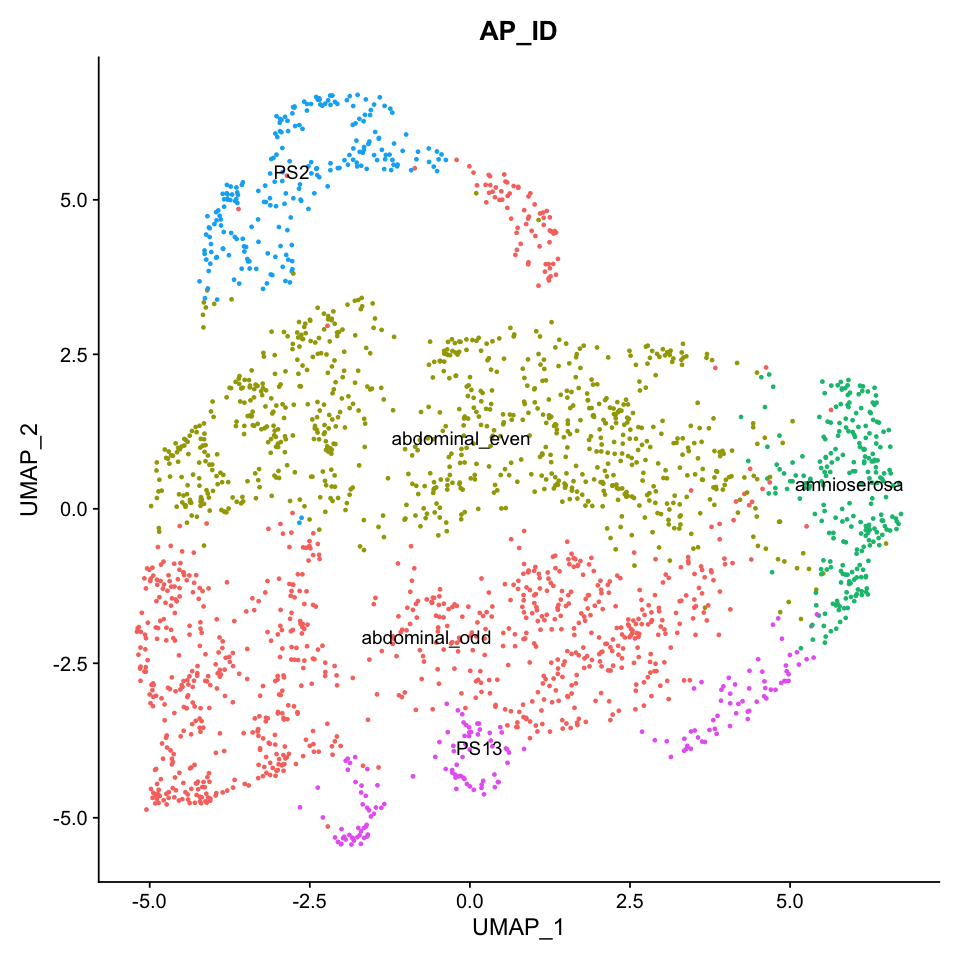

In [35]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC_trunk_ect, reduction =  "umap", group.by = 'AP_ID',label = TRUE) + NoLegend()

In [36]:
levels <- read.table(file="./lateral_ect_AP_levels_color.txt")
colors <- levels[,2]
levels <- levels[,1]
head(levels)
length(levels)
head(colors)

[1] "PS2"            "abdominal_odd"  "abdominal_even" "PS13"          
[5] "amnioserosa"

[1] 5

[1] "skyblue3"   "plum3"      "olivedrab3" "goldenrod3" "gray75"

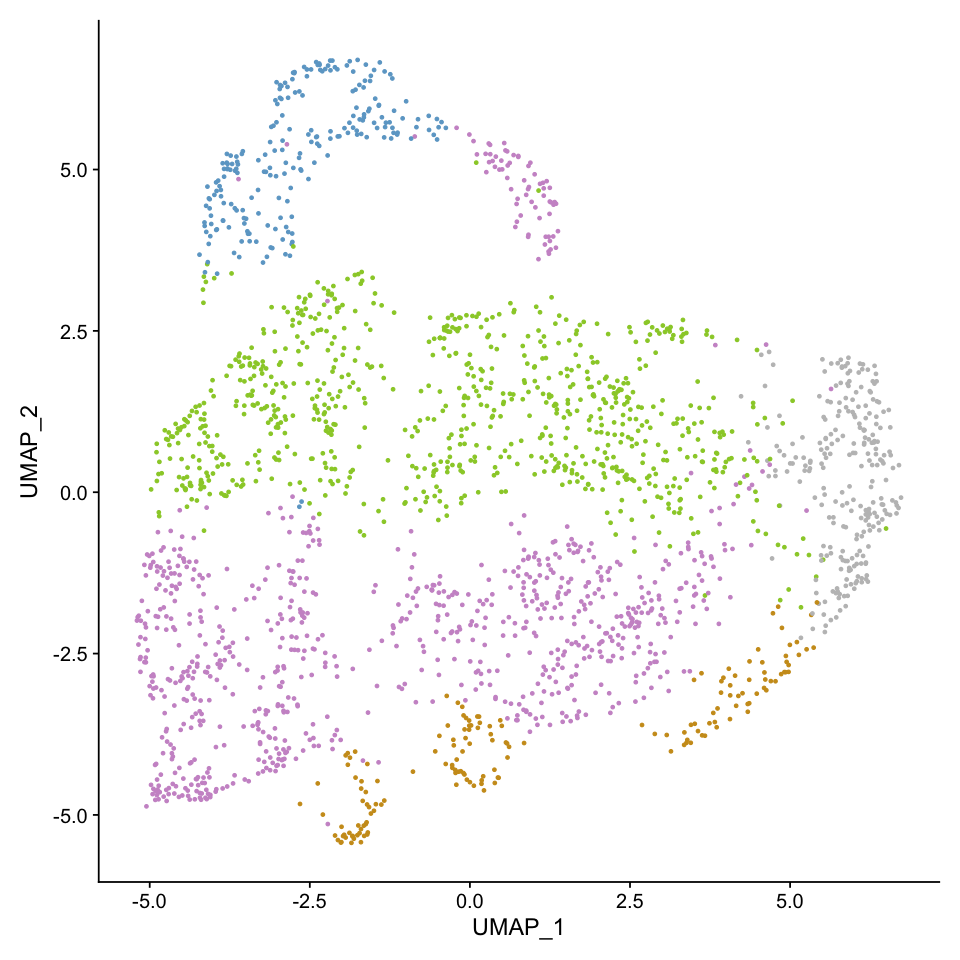

In [37]:
Idents(seu_HQC_trunk_ect) <- 'AP_ID'
levels(seu_HQC_trunk_ect) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_trunk_ect, reduction =  "umap", label = FALSE, cols = colors) + NoLegend() 
fig
ggsave(fig, file = "./figures/02_subclustering_lateral_ect_manualID/lateral_ecto_umap_AP_IDs.eps", dpi = 300, width =8, height = 8)

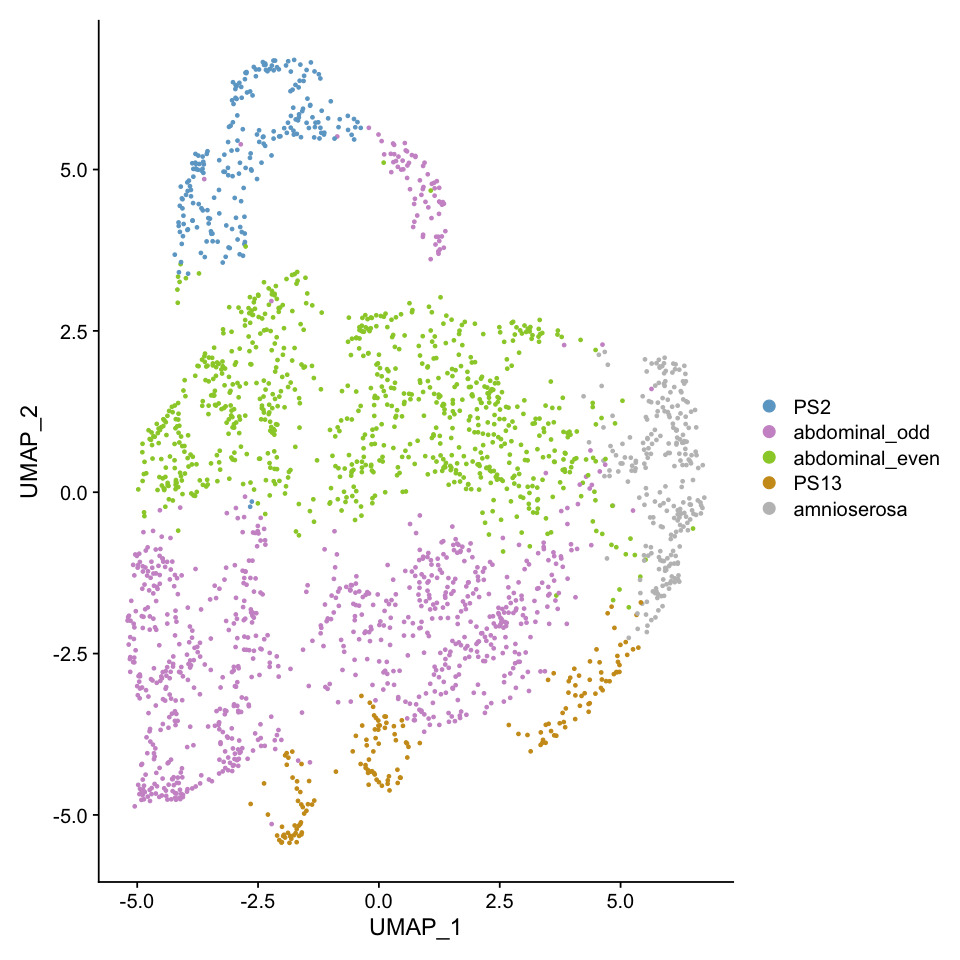

In [38]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_trunk_ect, reduction =  "umap", label = FALSE, cols = colors) 
fig
ggsave(fig, file = "./figures/02_subclustering_lateral_ect_manualID/lateral_ecto_umap2_AP_IDs.eps", dpi = 300, width =8, height = 8)

## DV-annotation

In [39]:
DV_genes <- c("rho", "vnd", "pnt", "ind", "sog", "SoxN", "brk", "dpp", "Egfr", "vn", "pnt",
              "Atx-1", "egr", "cv-2", "Doc1", "Ance", "Dr", "emc", "cic",
              "mirr", "ush", "Ama", "bbg", "tup", "zen", "Doc2", "Z600", "C15", "peb",
             "Dtg", "CG13653", "Doc3", "dap","srp", "stg")

In [40]:
trunk_ect_normcout <- GetAssayData(seu_HQC_trunk_ect)
dim(trunk_ect_normcout)

[1] 9808 2350

In [41]:
trunk_ect_normcout_DV <- trunk_ect_normcout[DV_genes, ]
dim(trunk_ect_normcout_DV)

[1]   35 2350

In [42]:
#k-means clustering using DV-genes (K=7)
set.seed(1)
trunk_ect_DV_cluster <- kmeans(x=t(trunk_ect_normcout_DV), centers=7)

In [43]:
trunk_ect_DV_cluster

K-means clustering with 7 clusters of sizes 252, 383, 417, 564, 210, 207, 317

Cluster means:
         rho        vnd       pnt        ind       sog      SoxN       brk
1 0.55596307 0.03072382 0.6071702 0.34086034 0.5956794 0.8011497 0.1217044
2 0.14178408 0.03496851 0.4786937 0.16705369 0.6409167 1.7168889 0.1461843
3 0.07994420 0.01163556 0.3727814 0.09851111 1.6586052 3.8107249 0.8321408
4 0.71567431 1.13248075 2.4094451 0.13074068 4.6760704 3.9221437 1.5414308
5 2.71645423 0.02939898 0.8172544 0.14498804 0.9285062 1.2977957 0.1568156
6 1.95609253 0.04795751 0.6337782 0.29202376 0.6698668 0.9165008 0.1076461
7 0.08511238 0.04719734 0.9487883 2.70670920 3.5841597 3.9982801 1.5584347
         dpp     Egfr        vn       pnt     Atx-1        egr      cv-2
1 1.62972632 2.869868 0.4296768 0.6071702 2.6275182 1.14289944 2.7121650
2 1.36300487 3.329224 0.1760685 0.4786937 3.4319429 0.22517126 2.3106857
3 0.37859956 3.337343 0.1006787 0.3727814 3.5631537 0.06162995 1.2116268
4 0.03807849 1

In [44]:
trunk_ect_DV_cluster_ID <- trunk_ect_DV_cluster$cluster
head(trunk_ect_DV_cluster_ID)

AAACCCAAGCAACAAT AAACCCACAGGGAGAG AAACCCATCCAGTGCG AAACCCATCCGGACTG 
               6                4                5                6 
AAACGAAAGACATAGT AAACGAACACATACTG 
               4                5

In [45]:
trunk_ect_DV_cluster_ID <- as.data.frame(trunk_ect_DV_cluster_ID)
head(trunk_ect_DV_cluster_ID)

,trunk_ect_DV_cluster_ID
,<int>
AAACCCAAGCAACAAT,6
AAACCCACAGGGAGAG,4
AAACCCATCCAGTGCG,5
AAACCCATCCGGACTG,6
AAACGAAAGACATAGT,4
AAACGAACACATACTG,5


In [46]:
colnames(trunk_ect_DV_cluster_ID) <- c("ID")

In [47]:
trunk_ect_DV_cluster_ID$ID <- as.factor( trunk_ect_DV_cluster_ID$ID)
head(trunk_ect_DV_cluster_ID)

,ID
,<fct>
AAACCCAAGCAACAAT,6
AAACCCACAGGGAGAG,4
AAACCCATCCAGTGCG,5
AAACCCATCCGGACTG,6
AAACGAAAGACATAGT,4
AAACGAACACATACTG,5


In [48]:
seu_HQC_trunk_ect$DV_ID <- trunk_ect_DV_cluster_ID

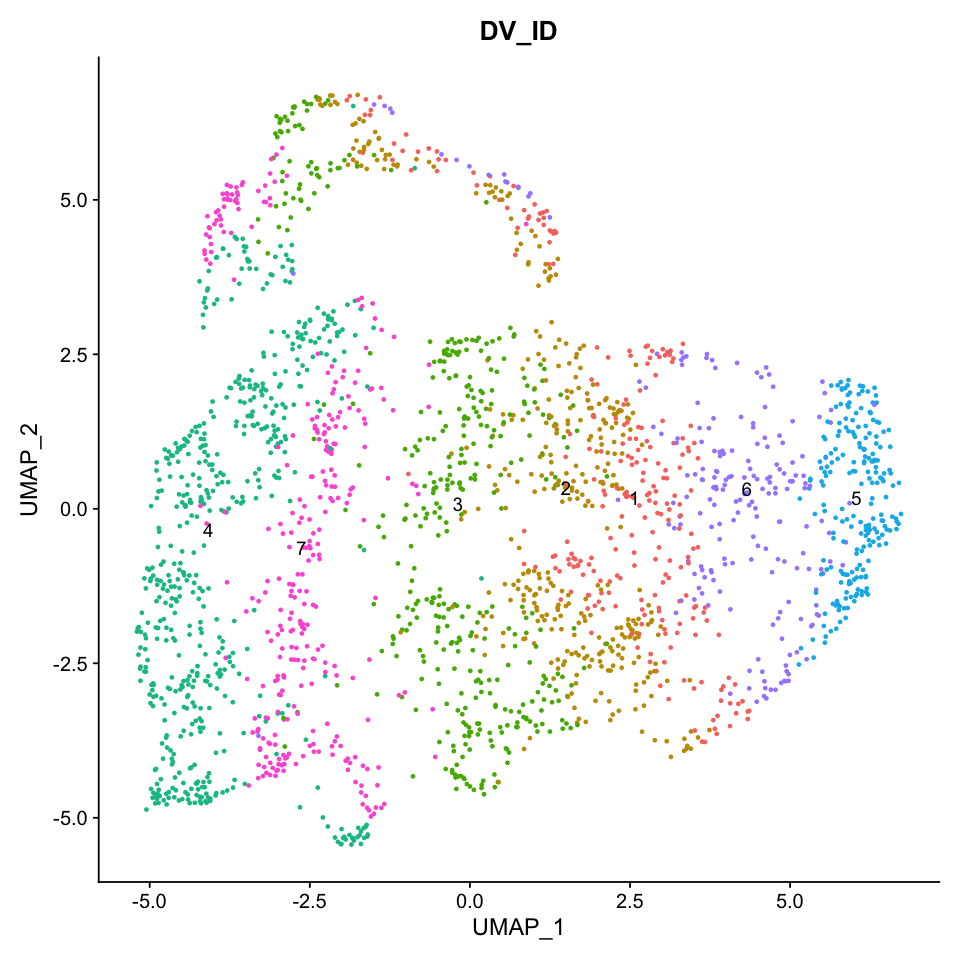

In [49]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC_trunk_ect, reduction =  "umap", group.by = "DV_ID", label = TRUE) + NoLegend()

In [50]:
Idents(seu_HQC_trunk_ect) <- "DV_ID"

In [51]:
levels <- c(5,6,1,2,3,7,4)
levels(seu_HQC_trunk_ect) <- levels

In [52]:
all.markers.trunk.ect.DV <- FindAllMarkers(object = seu_HQC_trunk_ect, only.pos = TRUE)

Calculating cluster 5

Calculating cluster 6

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 7

Calculating cluster 4



In [53]:
all.markers.trunk.ect.DV.top10 <- all.markers.trunk.ect.DV %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)


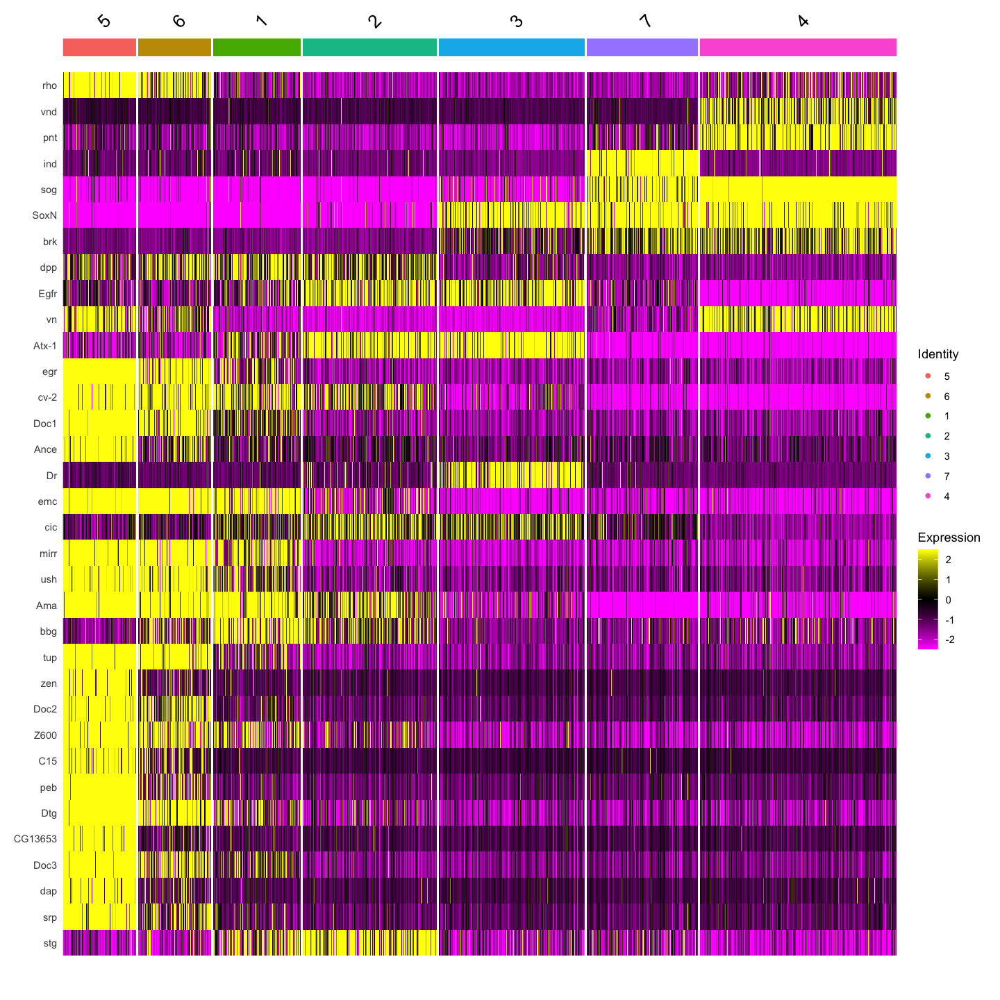

In [54]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu_HQC_trunk_ect, features = DV_genes)

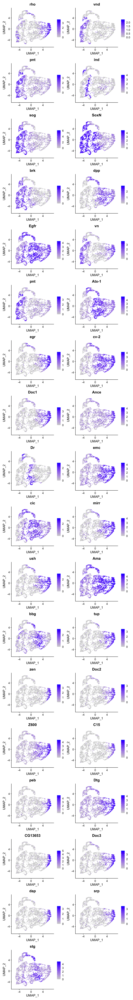

In [55]:
options(repr.plot.width=8, repr.plot.height=60)
FeaturePlot(seu_HQC_trunk_ect, reduction = "umap", features = DV_genes, pt.size = 0.5,  ncol = 2)

In [56]:
path = './figures/02_subclustering_lateral_ect_manualID'
for (name in c("vnd","ind","sog","SoxN","Dr","Atx-1","dpp","tup", "Doc2","dap","zen","peb")){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC_trunk_ect, features = name) + theme(plot.title = element_blank())
    basename = paste(name, 'Set3_lateral_ecto.eps')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

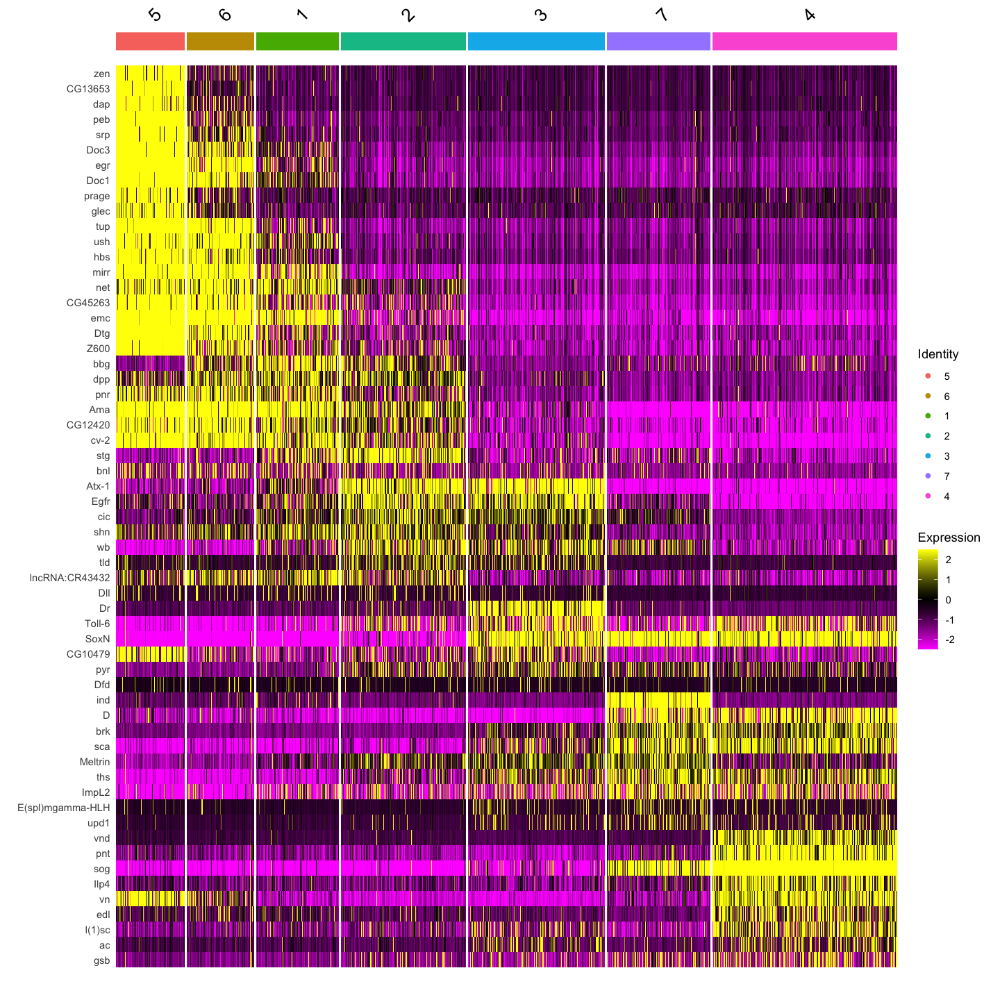

In [57]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu_HQC_trunk_ect, features = c(all.markers.trunk.ect.DV.top10$gene))

In [58]:
DV_ID <- as.data.frame(seu_HQC_trunk_ect$DV_ID)
colnames(DV_ID) <- c('DV_ID')
head(DV_ID)
DV_ID$DV_ID <- dplyr::recode(DV_ID$DV_ID, 
                        "4" = "ectoderm_medial_NE",
                        "7" = "ectoderm_intermediate_NE",
                        "3" = "ectoderm_lateral_NE",
                        "2" = "ectoderm_lateral_DE",
                        "1" = "ectoderm_intermediate_DE",
                        "6" = "ectoderm_medial_DE",
                        "5" = "amnioserosa"
                        )
head(DV_ID)

,DV_ID
,<fct>
AAACCCAAGCAACAAT,6
AAACCCACAGGGAGAG,4
AAACCCATCCAGTGCG,5
AAACCCATCCGGACTG,6
AAACGAAAGACATAGT,4
AAACGAACACATACTG,5


,DV_ID
,<fct>
AAACCCAAGCAACAAT,ectoderm_medial_DE
AAACCCACAGGGAGAG,ectoderm_medial_NE
AAACCCATCCAGTGCG,amnioserosa
AAACCCATCCGGACTG,ectoderm_medial_DE
AAACGAAAGACATAGT,ectoderm_medial_NE
AAACGAACACATACTG,amnioserosa


In [59]:
seu_HQC_trunk_ect$DV_ID <- DV_ID

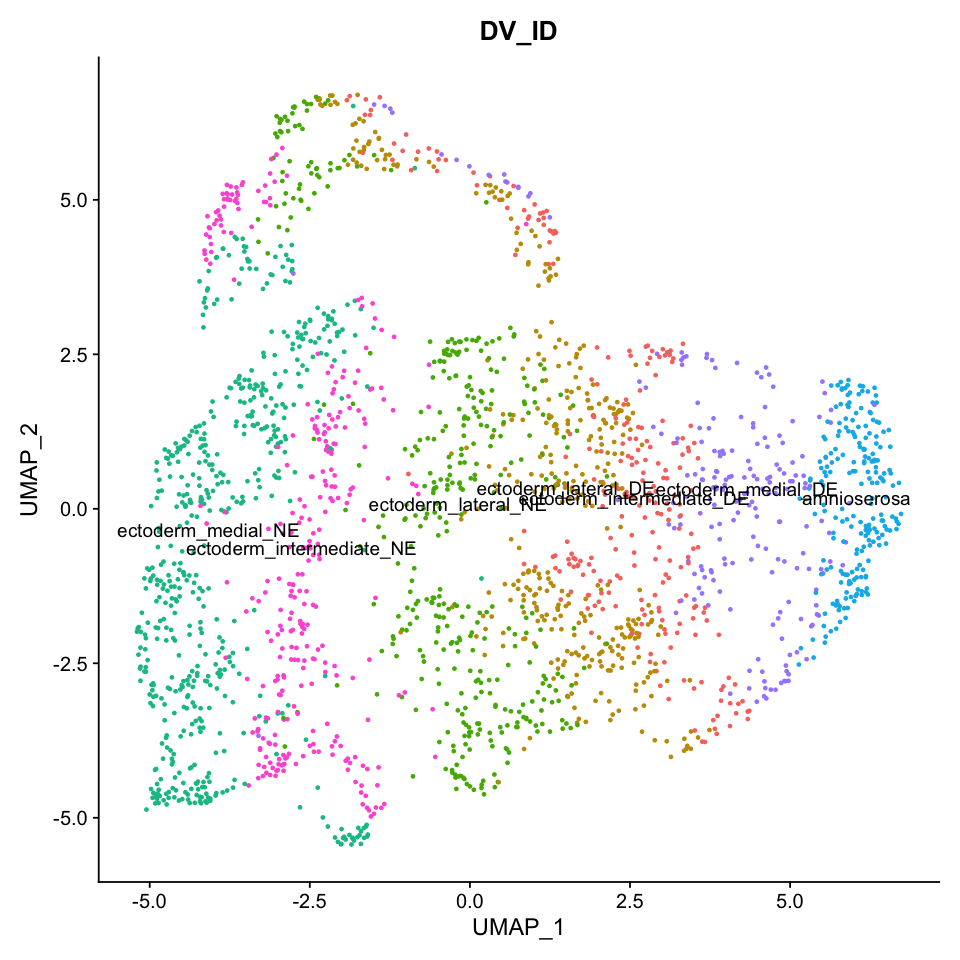

In [60]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC_trunk_ect, reduction =  "umap", group.by = "DV_ID", label = TRUE) + NoLegend()

In [61]:
levels <- read.table(file="./lateral_ect_DV_levels_color.txt")
colors <- levels[,2]
levels <- levels[,1]
head(levels)
length(levels)
head(colors)

[1] "ectoderm_medial_DE"       "ectoderm_intermediate_DE"
[3] "ectoderm_lateral_DE"      "ectoderm_lateral_NE"     
[5] "ectoderm_intermediate_NE" "ectoderm_medial_NE"

[1] 7

[1] "skyblue3"   "olivedrab2" "olivedrab4" "goldenrod3" "plum1"     
[6] "plum4"

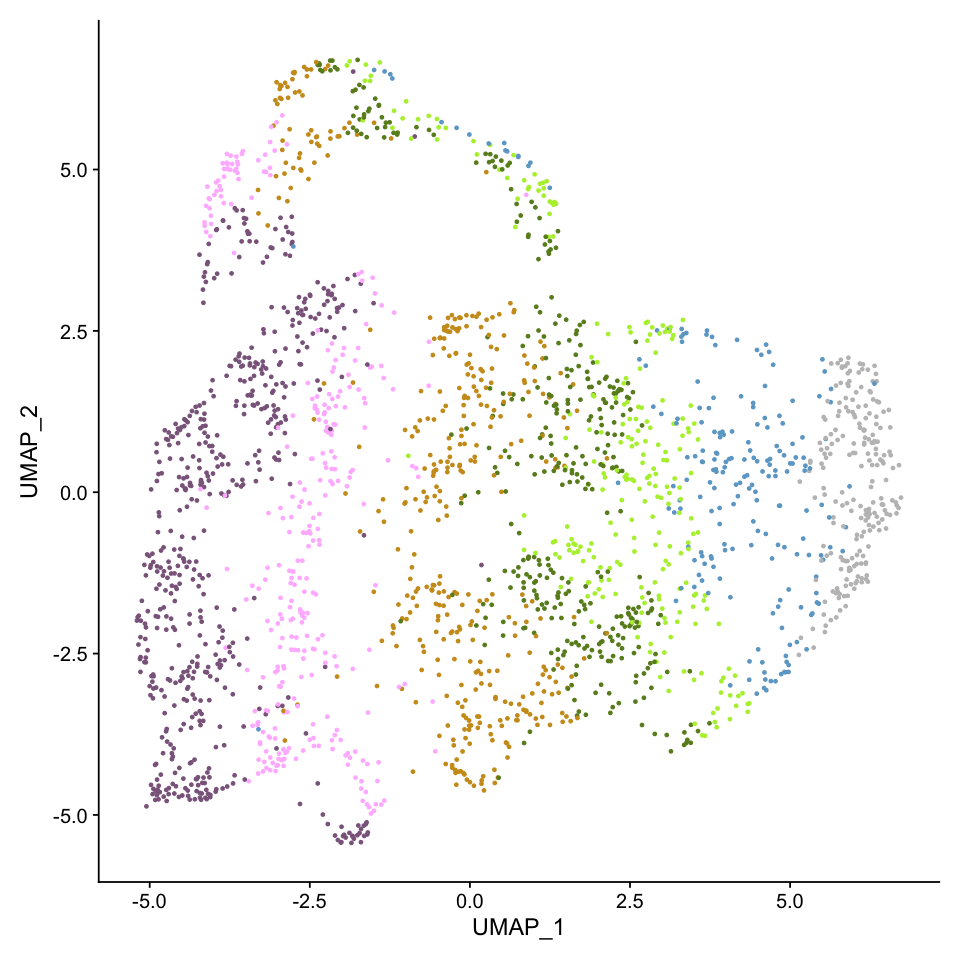

In [62]:
Idents(seu_HQC_trunk_ect) <- 'DV_ID'
levels(seu_HQC_trunk_ect) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_trunk_ect, reduction =  "umap", label = FALSE, cols = colors) + NoLegend() 
fig
ggsave(fig, file = "./figures/02_subclustering_lateral_ect_manualID/lateral_ecto_umap_DV_IDs.eps", dpi = 300, width =8, height = 8)

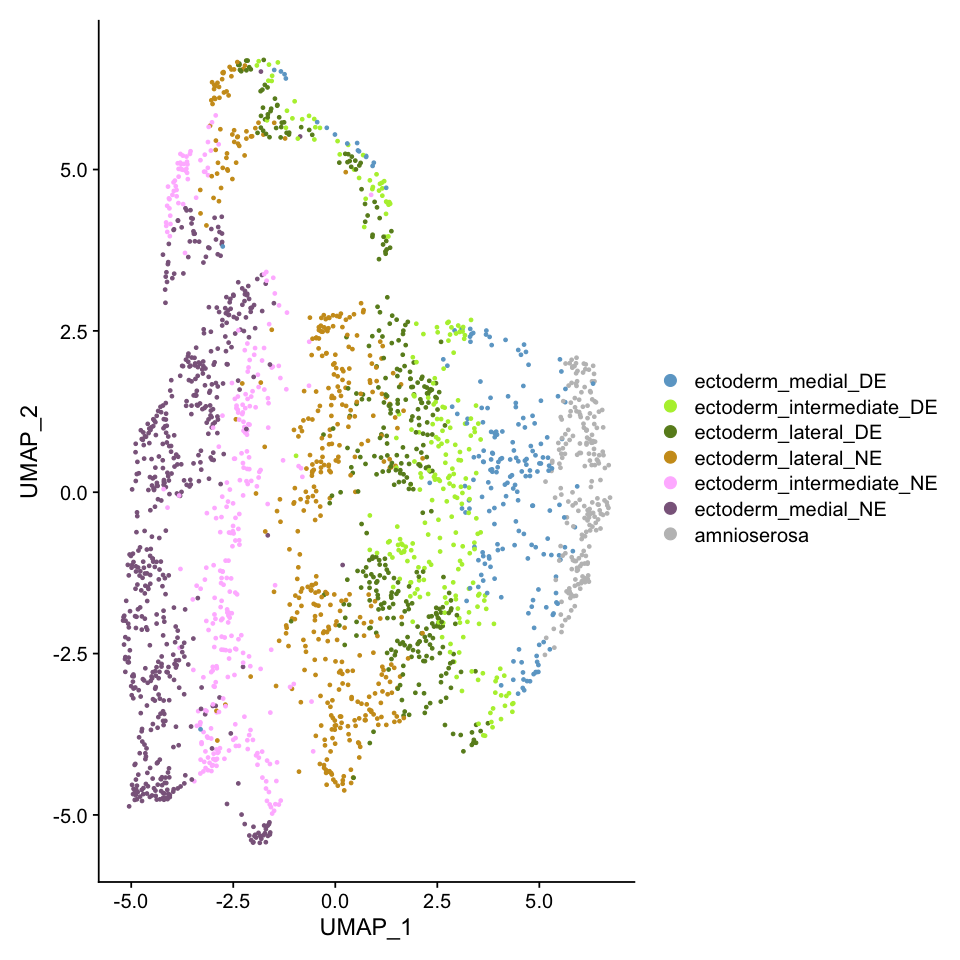

In [63]:
Idents(seu_HQC_trunk_ect) <- 'DV_ID'
levels(seu_HQC_trunk_ect) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_trunk_ect, reduction =  "umap", label = FALSE, cols = colors)
fig
ggsave(fig, file = "./figures/02_subclustering_lateral_ect_manualID/lateral_ecto_umap2_DV_IDs.eps", dpi = 300, width =8, height = 8)

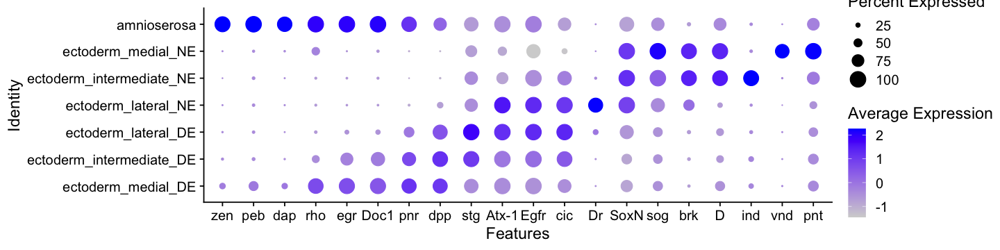

In [64]:
options(repr.plot.width=12, repr.plot.height=3)
fig <- DotPlot(object = seu_HQC_trunk_ect, 
        features = c("zen","peb","dap","rho","egr","Doc1","pnr","dpp","stg","Atx-1",
                    "Egfr","cic","Dr","SoxN","sog","brk","D","ind","vnd","pnt"))
fig
ggsave(fig, file = "./figures/02_subclustering_lateral_ect_manualID/leteral_ecto_DV_dotplot.eps", dpi = 300,  width = 12, height = 3)

## merge AP and DV information

In [65]:
table(seu_HQC_trunk_ect@meta.data[c('DV_ID','AP_ID')])

                          AP_ID
DV_ID                      abdominal_odd abdominal_even amnioserosa PS2 PS13
  ectoderm_intermediate_DE           103            108           0  19   22
  ectoderm_lateral_DE                184            143           0  42   14
  ectoderm_lateral_NE                136            167           0  62   52
  ectoderm_medial_NE                 255            243           0  39   27
  amnioserosa                          0              1         207   0    2
  ectoderm_medial_DE                  47             85          43   5   27
  ectoderm_intermediate_NE           154             89           0  54   20

In [66]:
merged.id <- as.data.frame(paste(seu_HQC_trunk_ect$DV_ID, "_", seu_HQC_trunk_ect$AP_ID, sep=""))
colnames(merged.id) <- c('manual_ID')
row.names(merged.id) <- colnames(seu_HQC_trunk_ect)
head(merged.id)

,manual_ID
,<chr>
AAACCCAAGCAACAAT,ectoderm_medial_DE_abdominal_even
AAACCCACAGGGAGAG,ectoderm_medial_NE_abdominal_even
AAACCCATCCAGTGCG,amnioserosa_amnioserosa
AAACCCATCCGGACTG,ectoderm_medial_DE_amnioserosa
AAACGAAAGACATAGT,ectoderm_medial_NE_abdominal_odd
AAACGAACACATACTG,amnioserosa_amnioserosa


In [67]:
merged.id$manual_ID <- gsub("amnioserosa_abdominal_even", "amnioserosa_trunk", merged.id$manual_ID) 
merged.id$manual_ID <- gsub("amnioserosa_abdominal_odd", "amnioserosa_trunk", merged.id$manual_ID) 
merged.id$manual_ID <- gsub("amnioserosa_amnioserosa", "amnioserosa_trunk", merged.id$manual_ID) 
merged.id$manual_ID <- gsub("ectoderm_medial_DE_amnioserosa", "amnioserosa_trunk", merged.id$manual_ID) 
merged.id$manual_ID <- gsub("amnioserosa_PS13", "amnioserosa_trunk", merged.id$manual_ID) 


head(merged.id)

,manual_ID
,<chr>
AAACCCAAGCAACAAT,ectoderm_medial_DE_abdominal_even
AAACCCACAGGGAGAG,ectoderm_medial_NE_abdominal_even
AAACCCATCCAGTGCG,amnioserosa_trunk
AAACCCATCCGGACTG,amnioserosa_trunk
AAACGAAAGACATAGT,ectoderm_medial_NE_abdominal_odd
AAACGAACACATACTG,amnioserosa_trunk


In [68]:
seu_HQC_trunk_ect$manual_ID <- merged.id
head(seu_HQC_trunk_ect$manual_ID)

AAACCCAAGCAACAAT                    AAACCCACAGGGAGAG 
"ectoderm_medial_DE_abdominal_even" "ectoderm_medial_NE_abdominal_even" 
                   AAACCCATCCAGTGCG                    AAACCCATCCGGACTG 
                "amnioserosa_trunk"                 "amnioserosa_trunk" 
                   AAACGAAAGACATAGT                    AAACGAACACATACTG 
 "ectoderm_medial_NE_abdominal_odd"                 "amnioserosa_trunk"

In [69]:
levels(as.factor(merged.id$manual_ID))

[1] "amnioserosa_trunk"                      
 [2] "ectoderm_intermediate_DE_abdominal_even"
 [3] "ectoderm_intermediate_DE_abdominal_odd" 
 [4] "ectoderm_intermediate_DE_PS13"          
 [5] "ectoderm_intermediate_DE_PS2"           
 [6] "ectoderm_intermediate_NE_abdominal_even"
 [7] "ectoderm_intermediate_NE_abdominal_odd" 
 [8] "ectoderm_intermediate_NE_PS13"          
 [9] "ectoderm_intermediate_NE_PS2"           
[10] "ectoderm_lateral_DE_abdominal_even"     
[11] "ectoderm_lateral_DE_abdominal_odd"      
[12] "ectoderm_lateral_DE_PS13"               
[13] "ectoderm_lateral_DE_PS2"                
[14] "ectoderm_lateral_NE_abdominal_even"     
[15] "ectoderm_lateral_NE_abdominal_odd"      
[16] "ectoderm_lateral_NE_PS13"               
[17] "ectoderm_lateral_NE_PS2"                
[18] "ectoderm_medial_DE_abdominal_even"      
[19] "ectoderm_medial_DE_abdominal_odd"       
[20] "ectoderm_medial_DE_PS13"                
[21] "ectoderm_medial_DE_PS2"                 
[22] "ectoderm_medial_NE_abdominal_even"      
[23] "ectoderm_medial_NE_abdominal_odd"       
[24] "ectoderm_medial_NE_PS13"                
[25] "ectoderm_medial_NE_PS2"

In [70]:
write.table(merged.id$manual_ID, 
            file="./manual_ID_list/seu_HQC_lateral_ect_manualID.txt",sep="\t",col.names=T,row.names=T,quote=F)

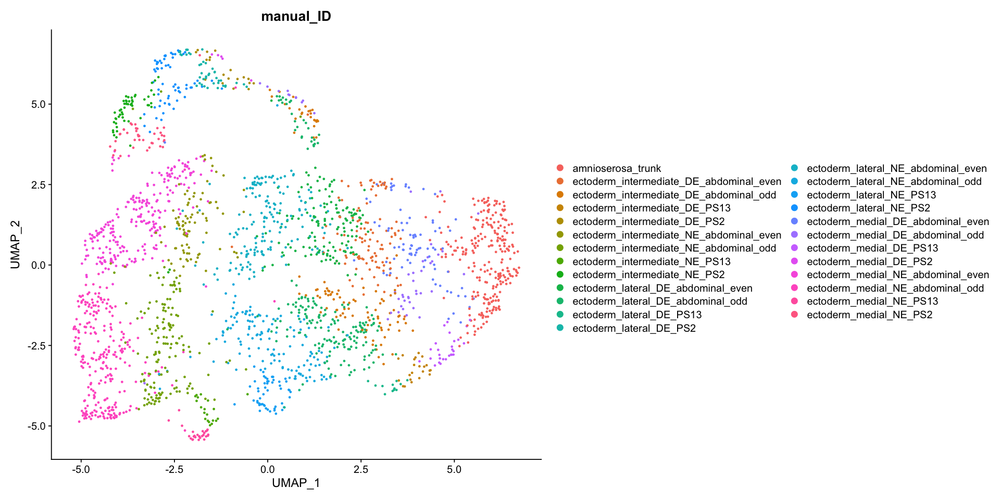

In [71]:
options(repr.plot.width=16, repr.plot.height=8)
DimPlot(seu_HQC_trunk_ect, reduction =  "umap", group.by = "manual_ID", label = FALSE) 

In [72]:
levels <- read.table(file="./lateral_ect_manual_ID_levels_color.txt")
colors <- levels[,2]
levels <- levels[,1]
head(levels)
length(levels)
head(colors)
Idents(seu_HQC_trunk_ect) <- 'manual_ID'
levels(seu_HQC_trunk_ect) <- levels

[1] "ectoderm_medial_DE_PS2"       "ectoderm_intermediate_DE_PS2"
[3] "ectoderm_lateral_DE_PS2"      "ectoderm_lateral_NE_PS2"     
[5] "ectoderm_intermediate_NE_PS2" "ectoderm_medial_NE_PS2"

[1] 25

[1] "skyblue1"   "skyblue3"   "skyblue4"   "slateblue3" "slateblue4"
[6] "blue4"

In [73]:
# Idents(seu_HQC_trunk_ect) <- 'manual_ID'
# levels(seu_HQC_trunk_ect) <- c('amnioserosa_trunk',
#                                'ectoderm_medial_DE_PS2','ectoderm_intermediate_DE_PS2','ectoderm_lateral_DE_PS2',
#                               'ectoderm_lateral_NE_PS2','ectoderm_intermediate_NE_PS2','ectoderm_medial_NE_PS2',
#                                'ectoderm_medial_DE_abdominal_odd','ectoderm_intermediate_DE_abdominal_odd',
#                                'ectoderm_lateral_DE_abdominal_odd','ectoderm_lateral_NE_abdominal_odd',
#                                'ectoderm_intermediate_NE_abdominal_odd','ectoderm_medial_NE_abdominal_odd',
#                                'ectoderm_medial_DE_abdominal_even','ectoderm_intermediate_DE_abdominal_even',
#                                'ectoderm_lateral_DE_abdominal_even','ectoderm_lateral_NE_abdominal_even',
#                                'ectoderm_intermediate_NE_abdominal_even','ectoderm_medial_NE_abdominal_even',
#                                'ectoderm_medial_DE_PS13','ectoderm_intermediate_DE_PS13',
#                                'ectoderm_lateral_DE_PS13','ectoderm_lateral_NE_PS13',
#                                'ectoderm_intermediate_NE_PS13','ectoderm_medial_NE_PS13'
#                               )
all.markers <- FindAllMarkers(seu_HQC_trunk_ect, only.pos = T)
dim(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster ectoderm_medial_DE_PS2

Calculating cluster ectoderm_intermediate_DE_PS2

Calculating cluster ectoderm_lateral_DE_PS2

Calculating cluster ectoderm_lateral_NE_PS2

Calculating cluster ectoderm_intermediate_NE_PS2

Calculating cluster ectoderm_medial_NE_PS2

Calculating cluster ectoderm_medial_DE_abdominal_odd

Calculating cluster ectoderm_intermediate_DE_abdominal_odd

Calculating cluster ectoderm_lateral_DE_abdominal_odd

Calculating cluster ectoderm_lateral_NE_abdominal_odd

Calculating cluster ectoderm_intermediate_NE_abdominal_odd

Calculating cluster ectoderm_medial_NE_abdominal_odd

Calculating cluster ectoderm_medial_DE_abdominal_even

Calculating cluster ectoderm_intermediate_DE_abdominal_even

Calculating cluster ectoderm_lateral_DE_abdominal_even

Calculating cluster ectoderm_lateral_NE_abdominal_even

Calculating cluster ectoderm_intermediate_NE_abdominal_even

Calculating cluster ectoderm_medial_NE_abdominal_even

Calculating cluster ectoderm_medial_DE_P

[1] 2387    7

[1] 250

Saving 7 x 7 in image



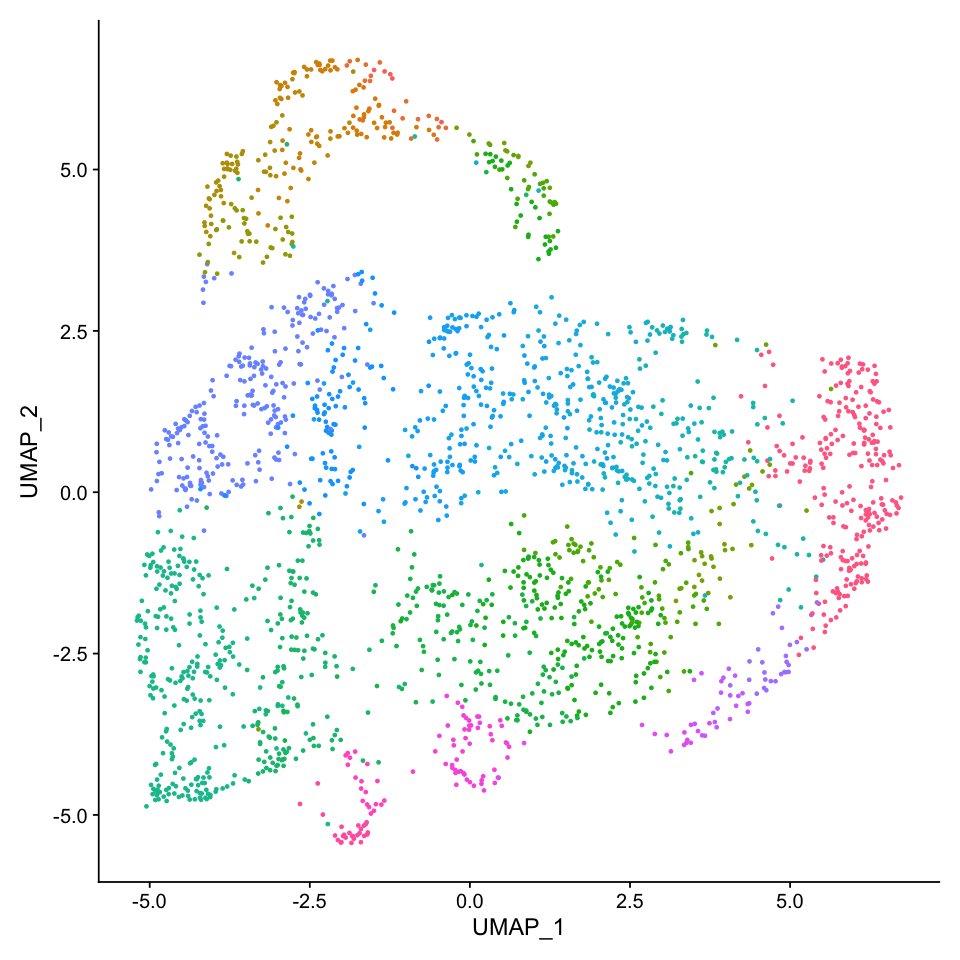

In [74]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_trunk_ect, reduction =  "umap", label = FALSE) + NoLegend() 
fig
ggsave(fig, file = "./figures/02_subclustering_lateral_ect_manualID/lateral_ect_umap1.eps", dpi = 300)

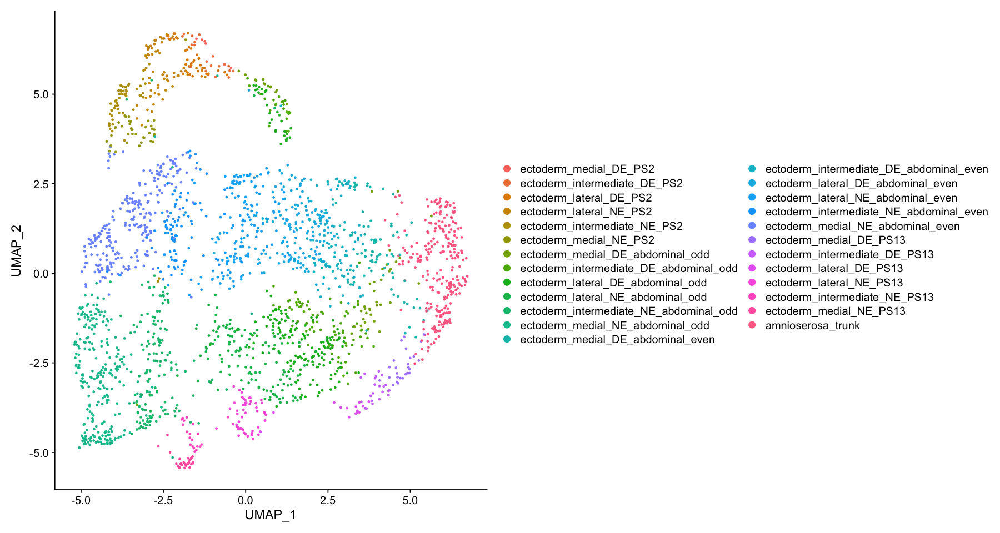

In [75]:
options(repr.plot.width=15, repr.plot.height=8)
fig <- DimPlot(seu_HQC_trunk_ect, reduction =  "umap", label = FALSE)
fig
ggsave(fig, file = "./figures/02_subclustering_lateral_ect_manualID/lateral_ect_umap2.eps", dpi = 300, width =15, height = 8)

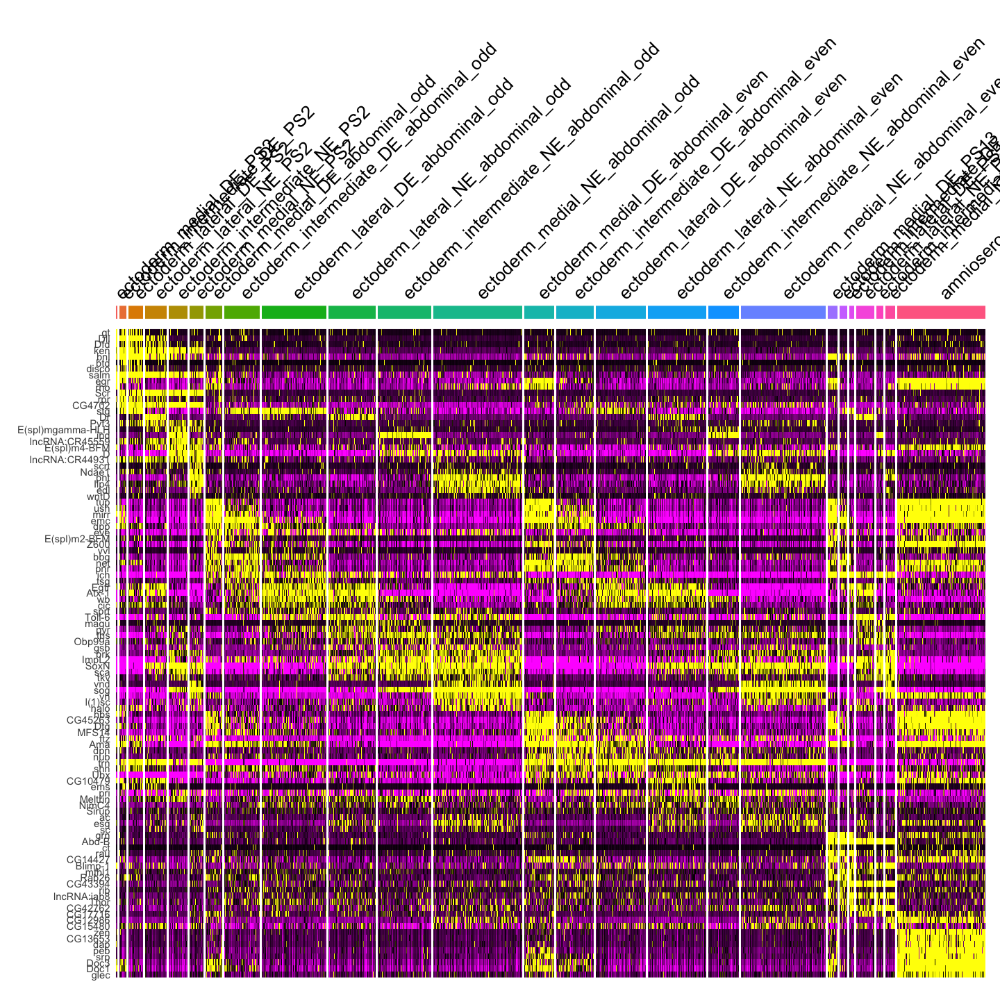

In [76]:
options(repr.plot.width=12, repr.plot.height=12)
fig <- DoHeatmap(seu_HQC_trunk_ect, features = c(all.markers.top10$gene)) + NoLegend()
fig
ggsave(fig, file = "./figures/02_subclustering_lateral_ect_manualID/lateral_ecto_manualID_heatmap.eps", dpi = 300,  width = 12, height = 12)

In [77]:
write.table(all.markers, file = './subcluster_markers/markers_lateral_ecto.txt', sep = '\t')

In [78]:
saveRDS(seu_HQC_trunk_ect, file = '../../data/seurat_object/Set3/subclustering/seu_lateral_ecto_subclustered.obj')

In [79]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] forcats_0.5.0     stringr_1.4.0     purrr_0.3.4       readr_1.4.0      
 [5] tidyr_1.1.2       tidyverse_1.3.0   tibble_3.0.5      dplyr_1.0.3      
 [9] Matrix_1.3-2      data.table_1.13.6 magrittr_2.0.1    ggplot2_3.3.3    
[13] Seurat_3.2.3     

loaded via a namespace (and not attached):
  [1] Rtsne_0.15            colorspace_2.0-0      deldir_0.2-9         
  [4] ellipsis_0.3.1        ggridges_0.5.3        IRdisplay_0.7.0      
  [7] fs_1.5.0              base64enc_0.1-3       rstudi